# Identification and Classification of Viral Pneumonia by Image-Based Deep Learning
Hamza Khokhar
Final Project
Professor Biwas

## Preparing the data

In [25]:
# imports 
import os
import numpy as np
from tqdm import tqdm
import pandas as pd
from keras.preprocessing.image import ImageDataGenerator
import glob
import cv2
import matplotlib.pyplot as plt
from keras.applications.densenet import DenseNet121
from tensorflow.keras.layers import Conv2D, MaxPool2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.utils import to_categorical
from keras import models
from keras.preprocessing import image

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import tensorflow as tf
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, BatchNormalization, Activation, GlobalAveragePooling2D
from keras.constraints import maxnorm
from keras.layers.convolutional import Conv2D, MaxPooling2D
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from keras.utils.vis_utils import plot_model

In [26]:
# getting all the paths from corresponding images
paths_train_PNEUMONIA = glob.glob("chest_xray/train/PNEUMONIA/*.jpeg")
paths_train_NORMAL = glob.glob("chest_xray/train/NORMAL/*.jpeg")
paths_test_PNEUMONIA = glob.glob("chest_xray/test/PNEUMONIA/*.jpeg")
paths_test_NORMAL = glob.glob("chest_xray/test/NORMAL/*.jpeg")

# Total images for each folder
print('Train PNEUMONIA: '+str(len(paths_train_PNEUMONIA)))
print('Train NORMAL: '+str(len(paths_train_NORMAL)))
print('Test PNEUMONIA: '+str(len(paths_test_PNEUMONIA)))
print('Test PNEUMONIA: '+str(len(paths_test_NORMAL)))

# Total images for each Directory
print('Total Number of Train samples: '+ str(len(paths_train_PNEUMONIA)+len(paths_train_NORMAL)))
print('Total Number of Test samples: '+ str(len(paths_test_PNEUMONIA)+len(paths_test_NORMAL)))


Train PNEUMONIA: 3875
Train NORMAL: 1341
Test PNEUMONIA: 398
Test PNEUMONIA: 242
Total Number of Train samples: 5216
Total Number of Test samples: 640


In [27]:
train_images = []
train_labels = []
test_images = []
test_labels = []


for path in tqdm(paths_train_PNEUMONIA): 
    image= cv2.imread(path)
    image=cv2.resize(image, (256, 256))
    image=np.array(image)
    image = image.astype('float32')
    image /= 255 
    train_images.append(image)
    train_labels.append(1)

for path in tqdm(paths_train_NORMAL): 
    image= cv2.imread(path)
    image=cv2.resize(image, (256, 256))
    image=np.array(image)
    image = image.astype('float32')
    image /= 255 
    train_images.append(image)
    train_labels.append(0)
    
for path in tqdm(paths_test_PNEUMONIA): 
    image= cv2.imread(path)
    image=cv2.resize(image, (256, 256))
    image=np.array(image)
    image = image.astype('float32')
    image /= 255 
    test_images.append(image)
    test_labels.append(1)
    
for path in tqdm(paths_test_NORMAL): 
    image= cv2.imread(path)
    image=cv2.resize(image, (256, 256))
    image=np.array(image)
    image = image.astype('float32')
    image /= 255 
    test_images.append(image)
    test_labels.append(0)
    


100%|██████████| 242/242 [00:04<00:00, 56.03it/s]


In [28]:
train_images=np.array(train_images, np.float32)
train_labels=np.array(train_labels)
test_images=np.array(test_images, np.float32)
test_labels=np.array(test_labels)

In [29]:
print(train_images.shape) 
print(train_labels.shape) 
print(test_images.shape) 
print(test_labels.shape) 

(5216, 256, 256, 3)
(5216,)
(640, 256, 256, 3)
(640,)


In [14]:
datagen = ImageDataGenerator(
        featurewise_center = False,
        samplewise_center = False,
        featurewise_std_normalization = False, 
        samplewise_std_normalization = False,
        zca_whitening = False,
        horizontal_flip = False,
        vertical_flip = False,
        rotation_range = 10,  
        zoom_range = 0.1, 
        width_shift_range = 0.1, 
        height_shift_range = 0.1)

datagen.fit(train_images)
train_gen = datagen.flow(train_images, train_labels, batch_size = 32,shuffle=True)

## Implementing the Model

In [15]:
callbacks = [ 
    EarlyStopping(monitor = 'loss', patience = 7), 
    ReduceLROnPlateau(monitor = 'loss', patience = 4), 
    ModelCheckpoint('./cnn_model.best.hdf5', monitor='loss' , save_best_only=True) # saving the best model
]

In [135]:
def model():
    return Sequential([
        Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same', input_shape = (256,256,3)),
        Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.2),
        
        Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same'),
        Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.2),
        
        Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'),
        Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.2),
        
        Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'),
        Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.2),
        
        Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'),
        Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.2),
        
        Flatten(),
       
        Dense(1024, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        
        
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.4),
        
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dropout(0.2),
        
        Dense(1, activation = "sigmoid")
        
    ])

In [136]:
model = model()
model.compile(loss='binary_crossentropy', optimizer = 'adam', metrics=['accuracy'])
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 256, 256, 16)      448       
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 256, 256, 16)      2320      
_________________________________________________________________
batch_normalization_27 (Batc (None, 256, 256, 16)      64        
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 128, 128, 16)      0         
_________________________________________________________________
dropout_27 (Dropout)         (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 128, 128, 32)      4640      
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 128, 128, 32)     

In [20]:
learning_history = model.fit_generator((train_gen), 
                               epochs = 100, 
                               steps_per_epoch = train_images.shape[0] // 32,
                               validation_data = (train_images, train_labels),callbacks = callbacks)

Epoch 1/100
163/163 [==============================] - 474s 3s/step - loss: 0.5346 - accuracy: 0.7558 - val_loss: 2.3373 - val_accuracy: 0.7429
Epoch 2/100
163/163 [==============================] - 477s 3s/step - loss: 0.2470 - accuracy: 0.9135 - val_loss: 2.2303 - val_accuracy: 0.7429
Epoch 3/100
163/163 [==============================] - 478s 3s/step - loss: 0.2053 - accuracy: 0.9268 - val_loss: 1.5343 - val_accuracy: 0.7429
Epoch 4/100
163/163 [==============================] - 500s 3s/step - loss: 0.1844 - accuracy: 0.9350 - val_loss: 0.6049 - val_accuracy: 0.8106
Epoch 5/100
163/163 [==============================] - 499s 3s/step - loss: 0.1542 - accuracy: 0.9465 - val_loss: 0.2025 - val_accuracy: 0.9135
Epoch 6/100
163/163 [==============================] - 551s 3s/step - loss: 0.1344 - accuracy: 0.9540 - val_loss: 0.3393 - val_accuracy: 0.8698
Epoch 7/100
163/163 [==============================] - 575s 4s/step - loss: 0.1421 - accuracy: 0.9479 - val_loss: 0.6659 - val_accuracy:

## Performance Evaluation 

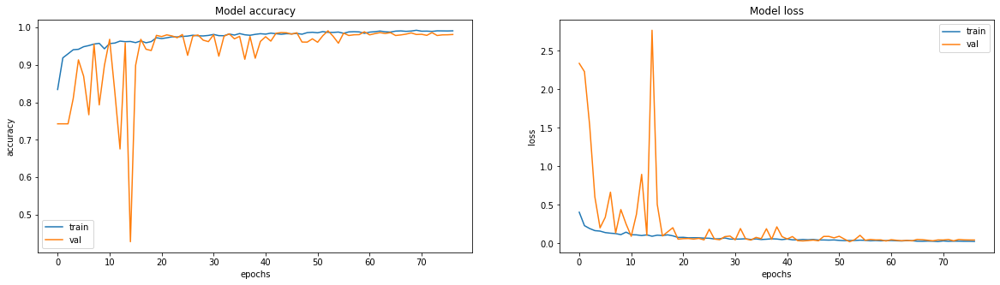

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5))
ax = ax.ravel()

for i, met in enumerate(['accuracy', 'loss']):
    ax[i].plot(learning_history.history[met])
    ax[i].plot(learning_history.history['val_' + met])
    ax[i].set_title('Model {}'.format(met))
    ax[i].set_xlabel('epochs')
    ax[i].set_ylabel(met)
    ax[i].legend(['train', 'val'])

In [22]:
y_pred = model.predict(test_images)


In [23]:
preds = []
for i in y_pred:
    if i >= 0.5:
        preds.append(1)
    else:
        preds.append(0)

In [24]:
print(classification_report(test_labels, preds))

              precision    recall  f1-score   support

           0       0.97      0.83      0.89       242
           1       0.90      0.98      0.94       398

    accuracy                           0.93       640
   macro avg       0.94      0.91      0.92       640
weighted avg       0.93      0.93      0.92       640



In [25]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

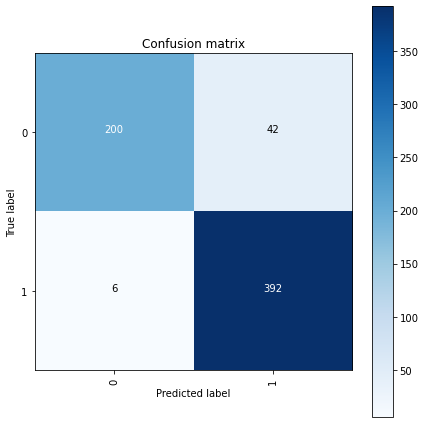

In [27]:
from sklearn.metrics import accuracy_score, confusion_matrix
confusion_mtx = confusion_matrix(test_labels, preds) 
cm = plot_confusion_matrix(confusion_mtx, classes = [0,1], normalize=False)

## For loading the saved Model and make predications

In [34]:
#new_model = tf.keras.models.load_model('cnn_model.best_binary.hdf5')
#new_model = tf.keras.models.load_model('../working/cnn_model.best4.hdf5')
from keras.models import load_model
 
# load model
new_model = load_model('cnn_model.best_binary.hdf5')


In [33]:
y_pred_new = new_model.predict(test_images)


In [35]:
y_pred_new1 = []
for i in y_pred_new:
    if i >= 0.5:
        y_pred_new1.append(1)
    else:
        y_pred_new1.append(0)


In [36]:
print(classification_report(test_labels, y_pred_new1))

              precision    recall  f1-score   support

           0       0.97      0.82      0.89       242
           1       0.90      0.98      0.94       398

    accuracy                           0.92       640
   macro avg       0.93      0.90      0.91       640
weighted avg       0.93      0.92      0.92       640



## Interpretability of the Model

In [ ]:
@inproceedings{lime,
  author    = {Marco Tulio Ribeiro and
               Sameer Singh and
               Carlos Guestrin},
  title     = {"Why Should {I} Trust You?": Explaining the Predictions of Any Classifier},
  booktitle = {Proceedings of the 22nd {ACM} {SIGKDD} International Conference on
               Knowledge Discovery and Data Mining, San Francisco, CA, USA, August
               13-17, 2016},
  pages     = {1135--1144},
  year      = {2016},
}

In [37]:
import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries

In [41]:
def explain_image(path,label_string):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(img, new_model.predict, top_labels=1, hide_color=0, num_samples=1000)
    source_image, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False)
    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    plt.title(label_string)
    plt.imshow(mark_boundaries(source_image, mask))
    ind =  explanation.top_labels[0]
    dict_heatmap = dict(explanation.local_exp[ind])
    heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
    plt.subplot(1,2,2)
    plt.title(label_string)
    plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
    plt.colorbar()

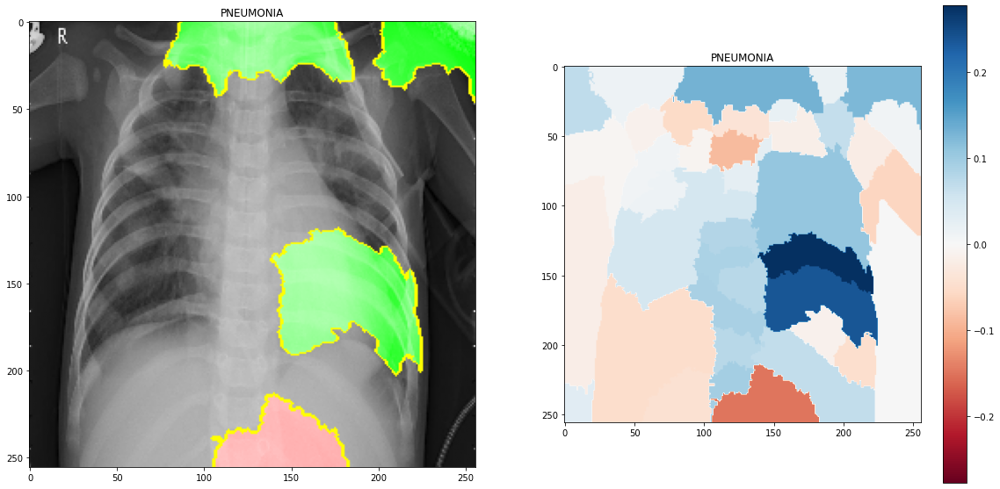

In [45]:
explain_image(paths_test_PNEUMONIA[0],'PNEUMONIA')


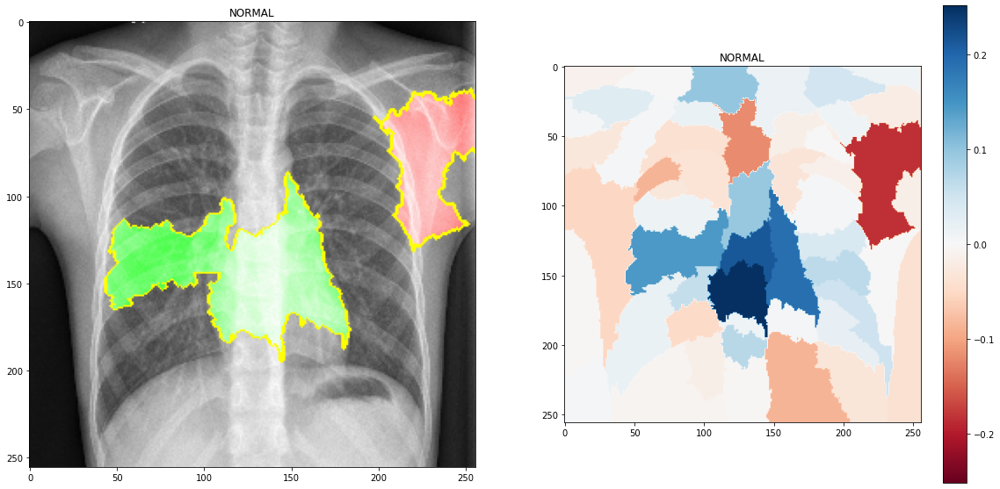

In [46]:
explain_image(paths_test_NORMAL[0],'NORMAL')

# citation
@misc{Keract,
  author = {Philippe Remy},
  title = {Keract: A library for visualizing activations and gradients},
  year = {2020},
  publisher = {GitHub},
  journal = {GitHub repository},
  howpublished = {\url{https://github.com/philipperemy/keract}},
}

conv2d_20_input (1, 256, 256, 3) 


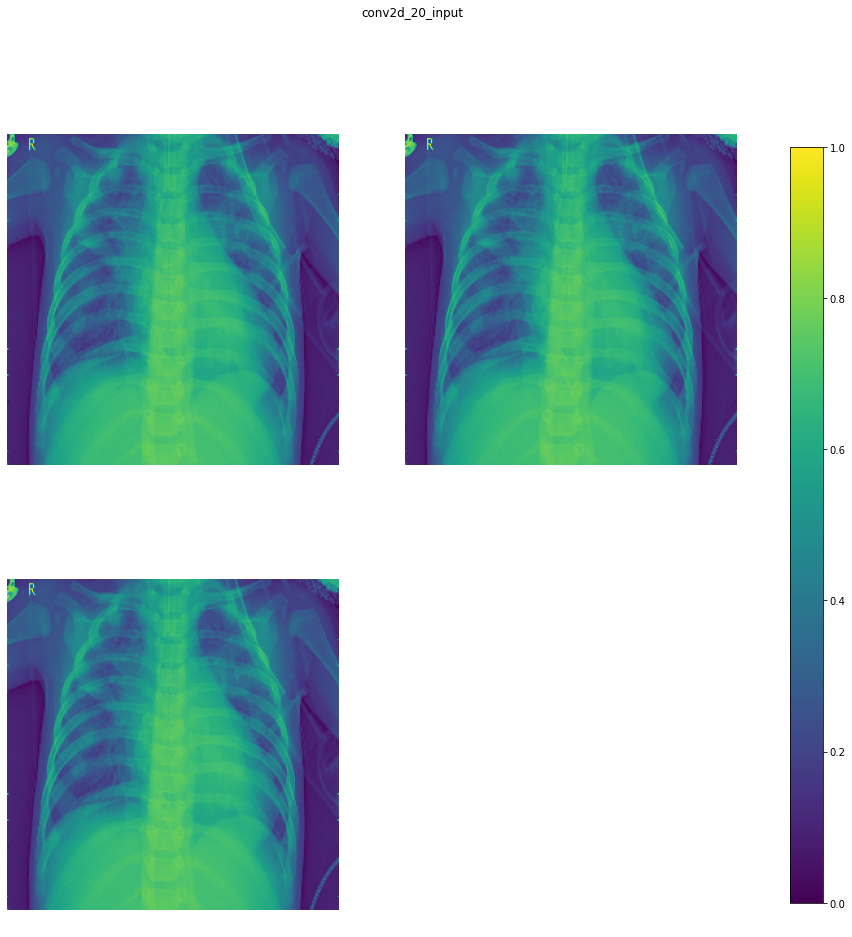

conv2d_20 (1, 256, 256, 16) 


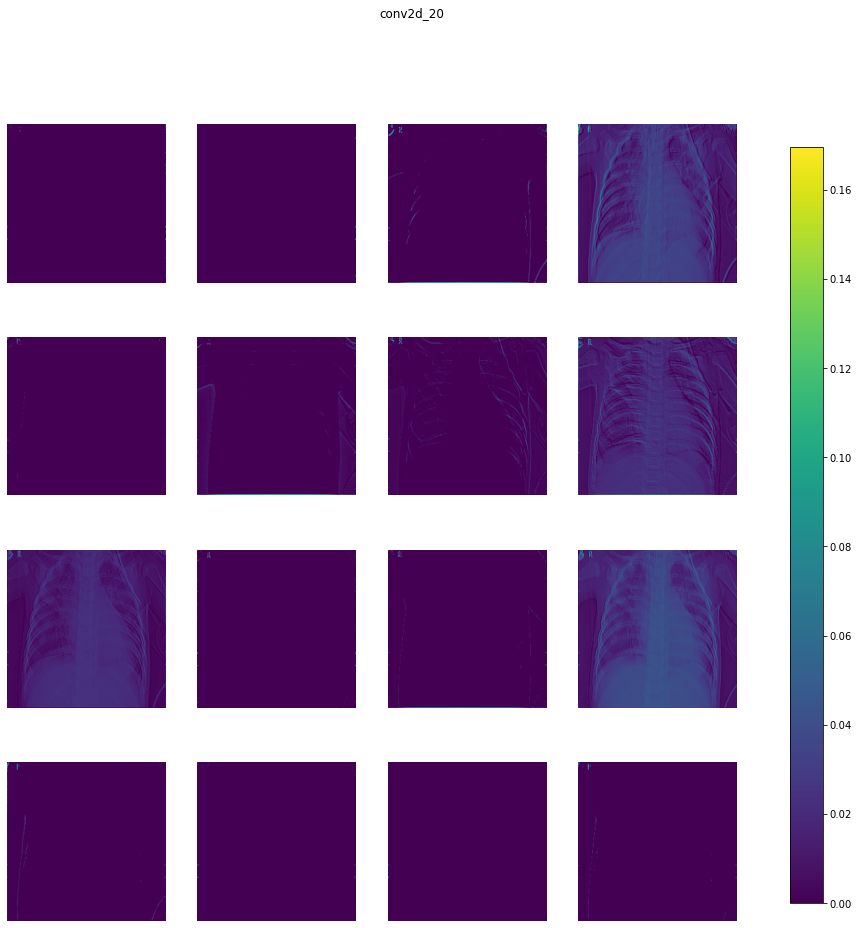

conv2d_21 (1, 256, 256, 16) 


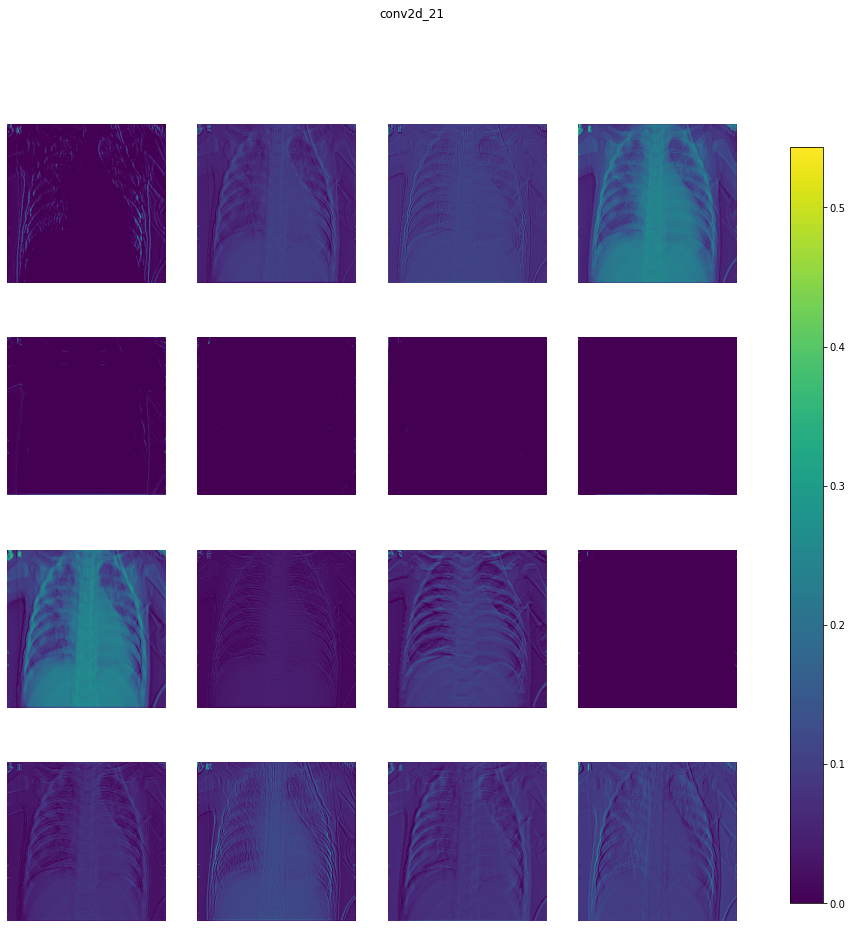

batch_normalization_18 (1, 256, 256, 16) 


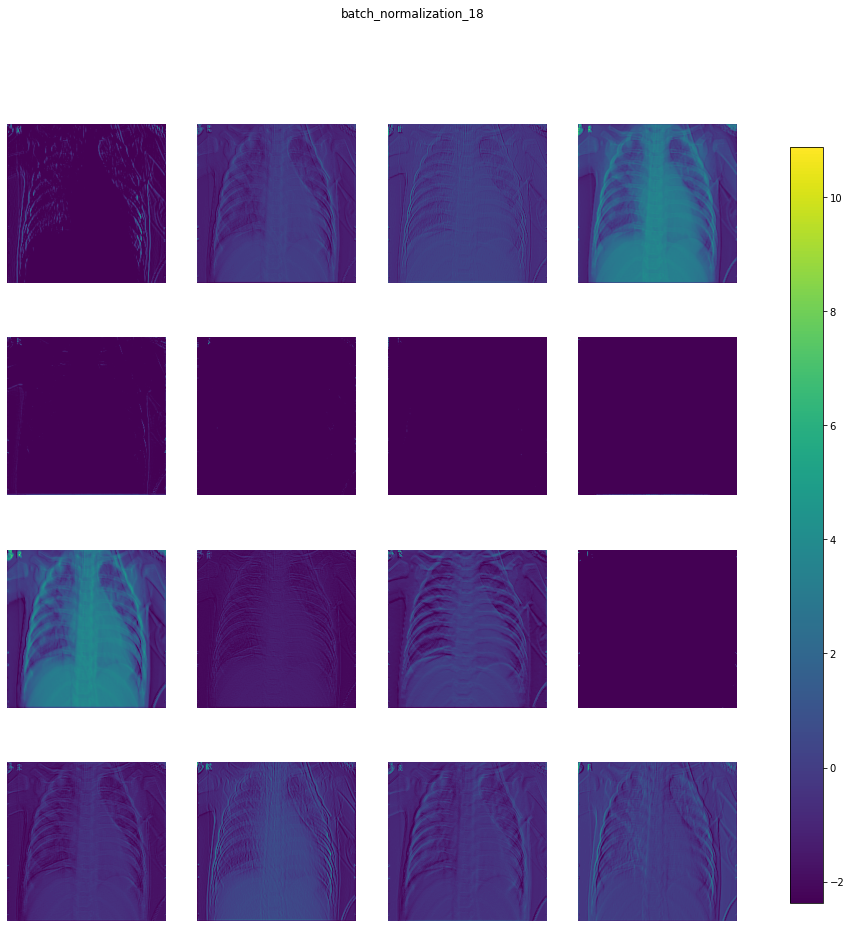

max_pooling2d_10 (1, 128, 128, 16) 


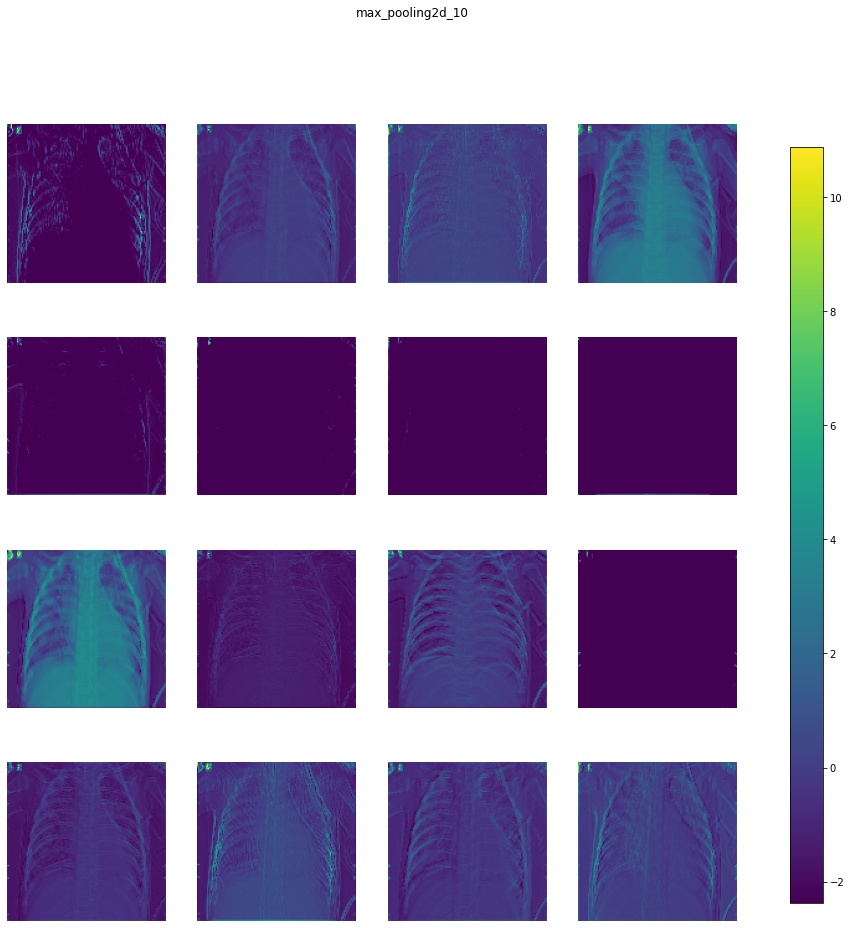

dropout_18 (1, 128, 128, 16) 


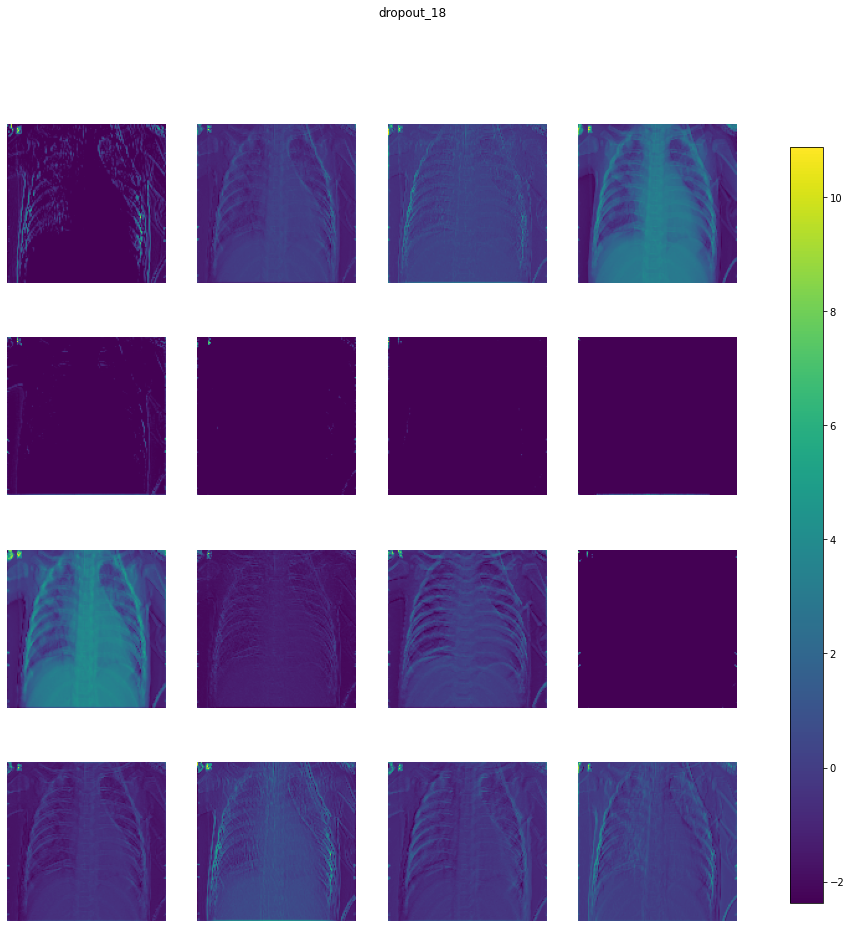

conv2d_22 (1, 128, 128, 32) 


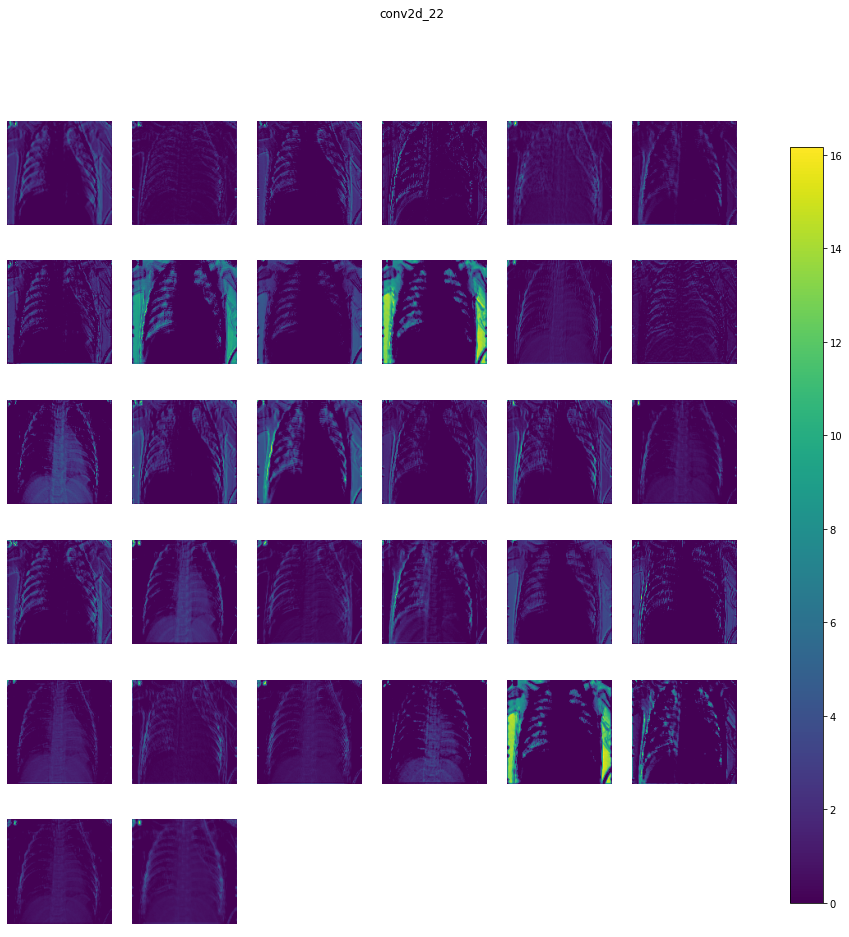

conv2d_23 (1, 128, 128, 32) 


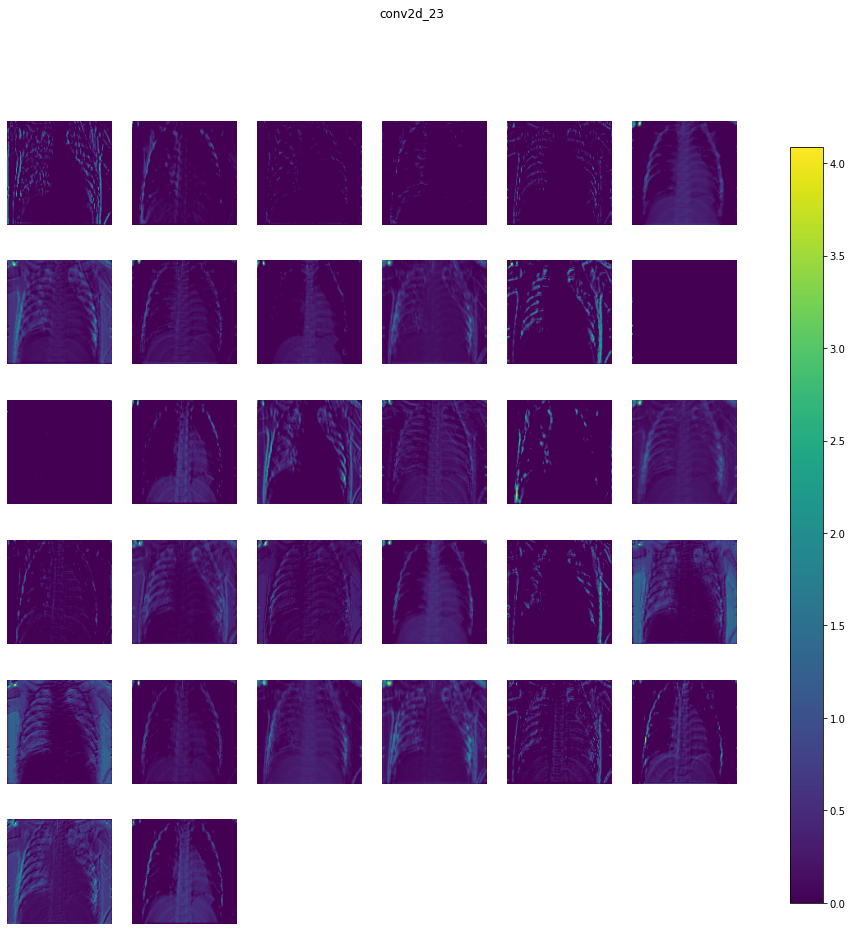

batch_normalization_19 (1, 128, 128, 32) 


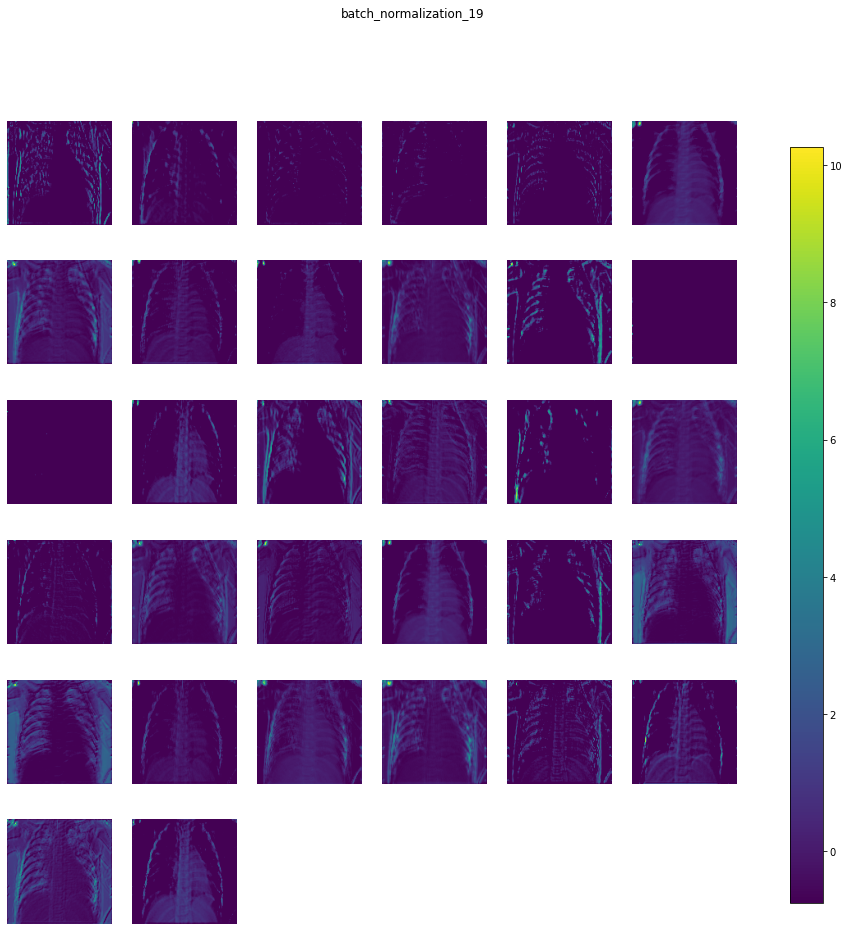

max_pooling2d_11 (1, 64, 64, 32) 


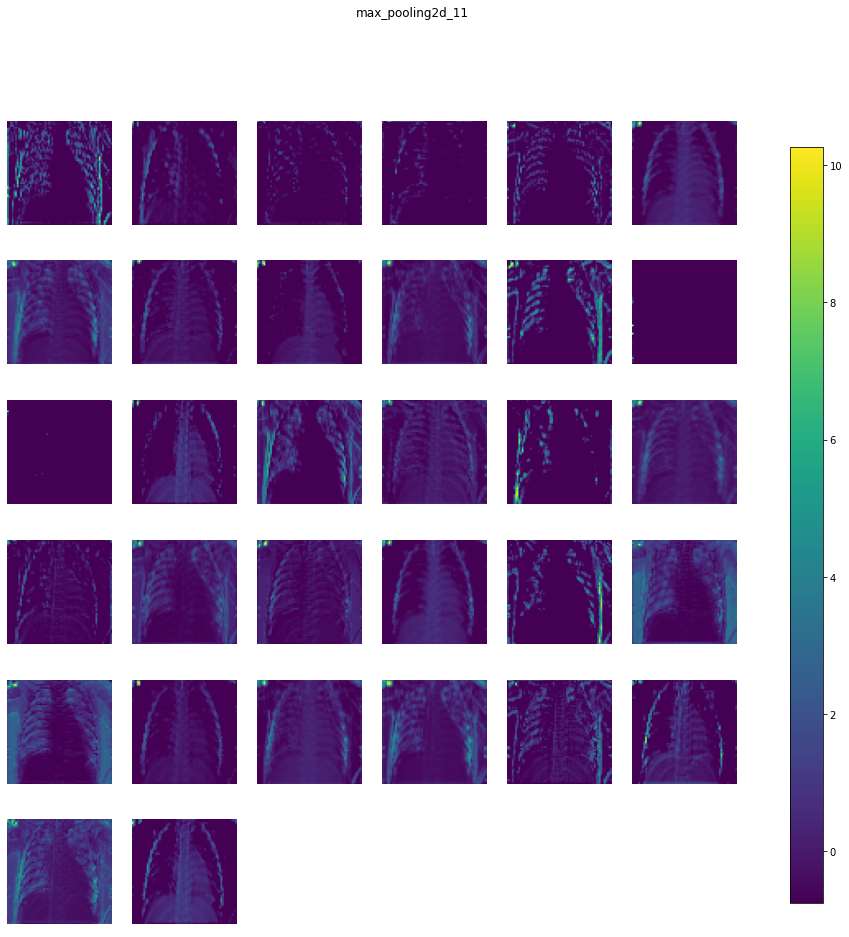

dropout_19 (1, 64, 64, 32) 


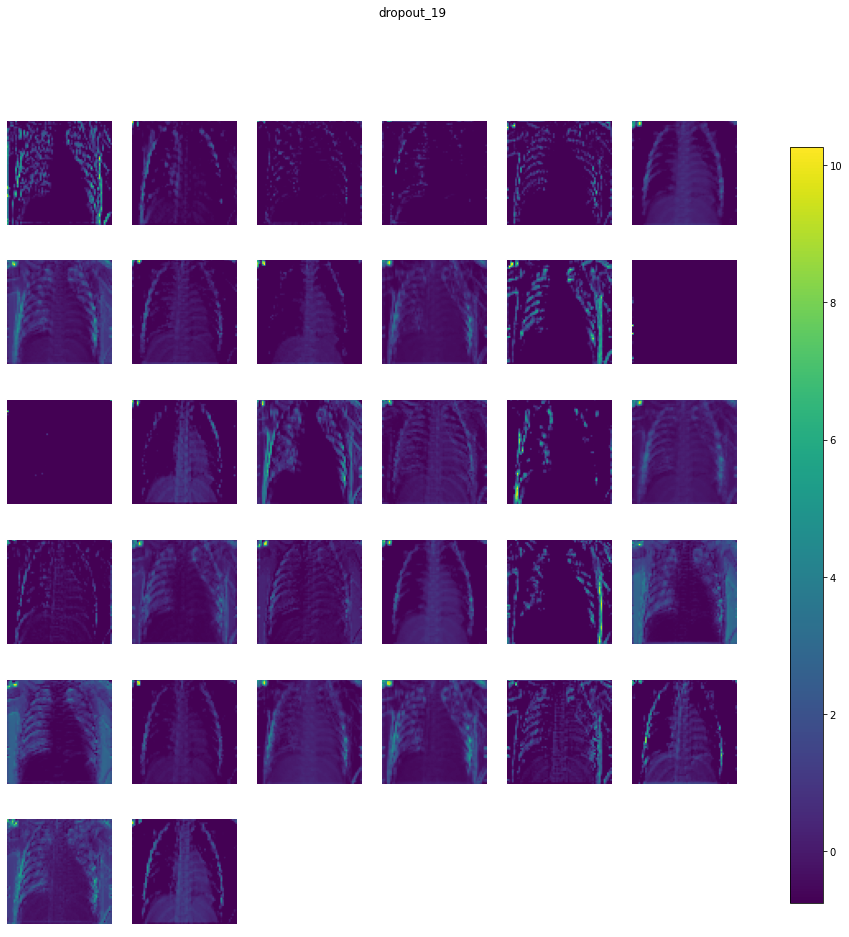

conv2d_24 (1, 64, 64, 64) 


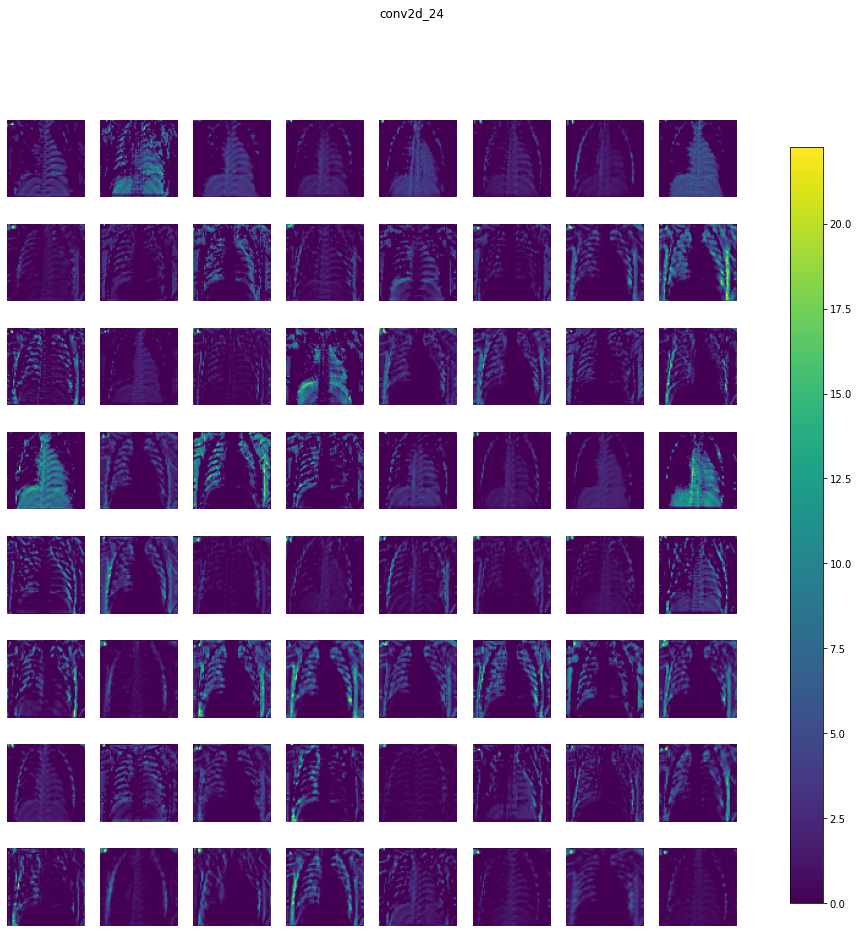

conv2d_25 (1, 64, 64, 64) 


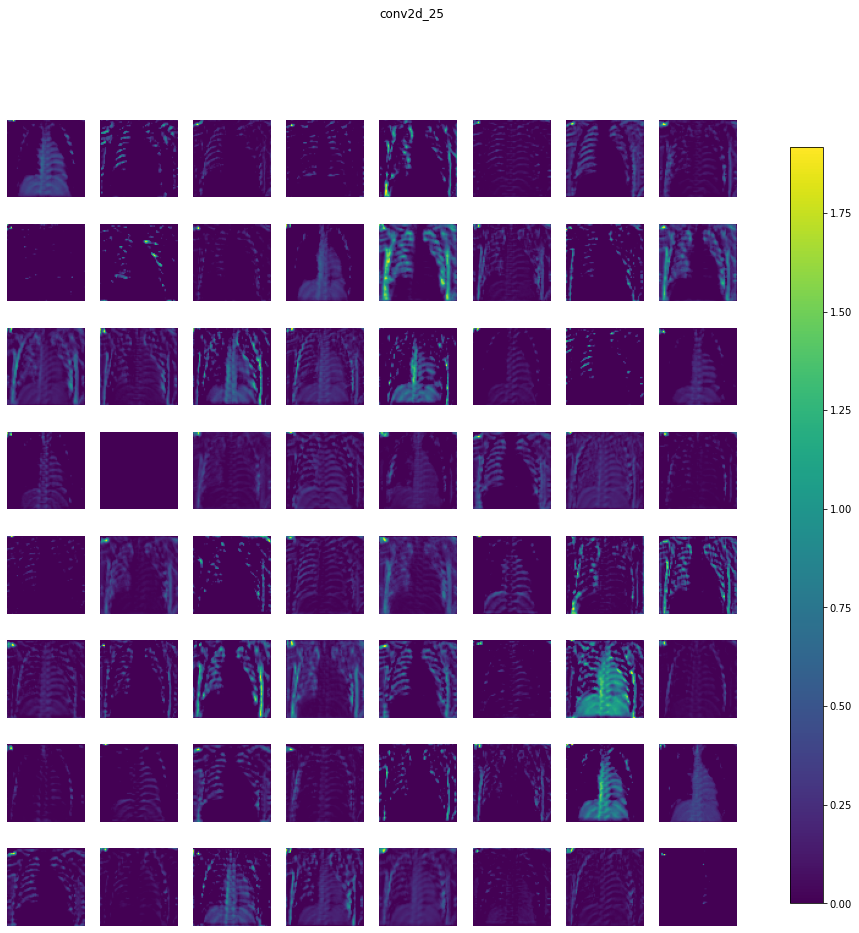

batch_normalization_20 (1, 64, 64, 64) 


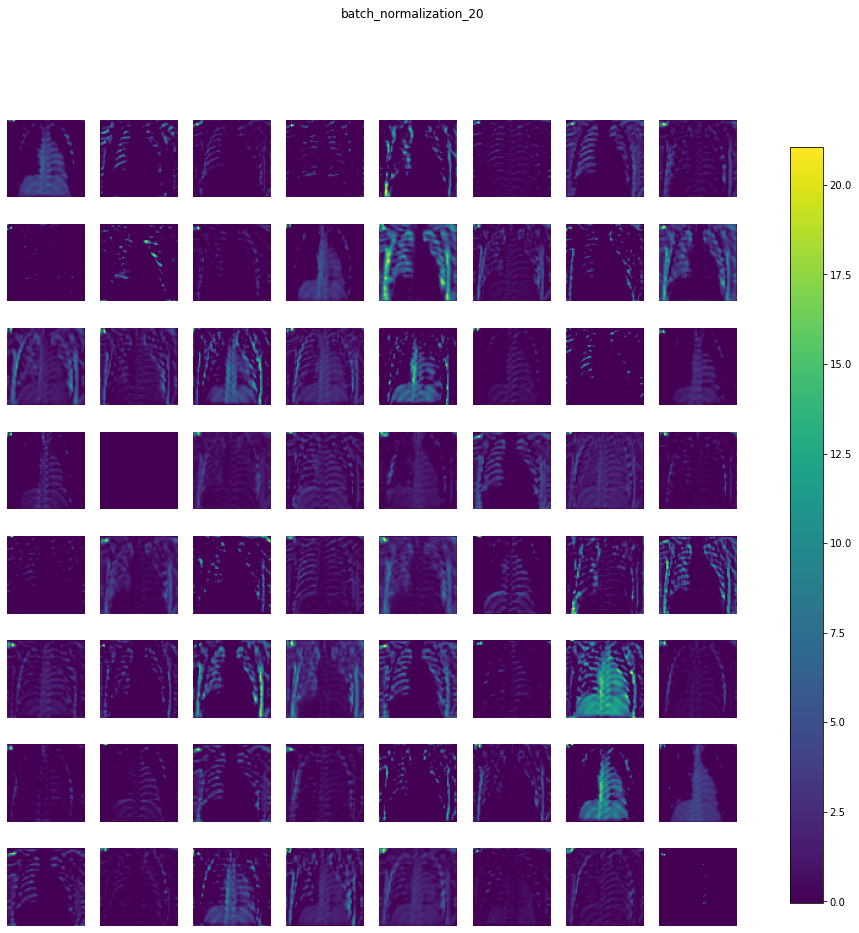

max_pooling2d_12 (1, 32, 32, 64) 


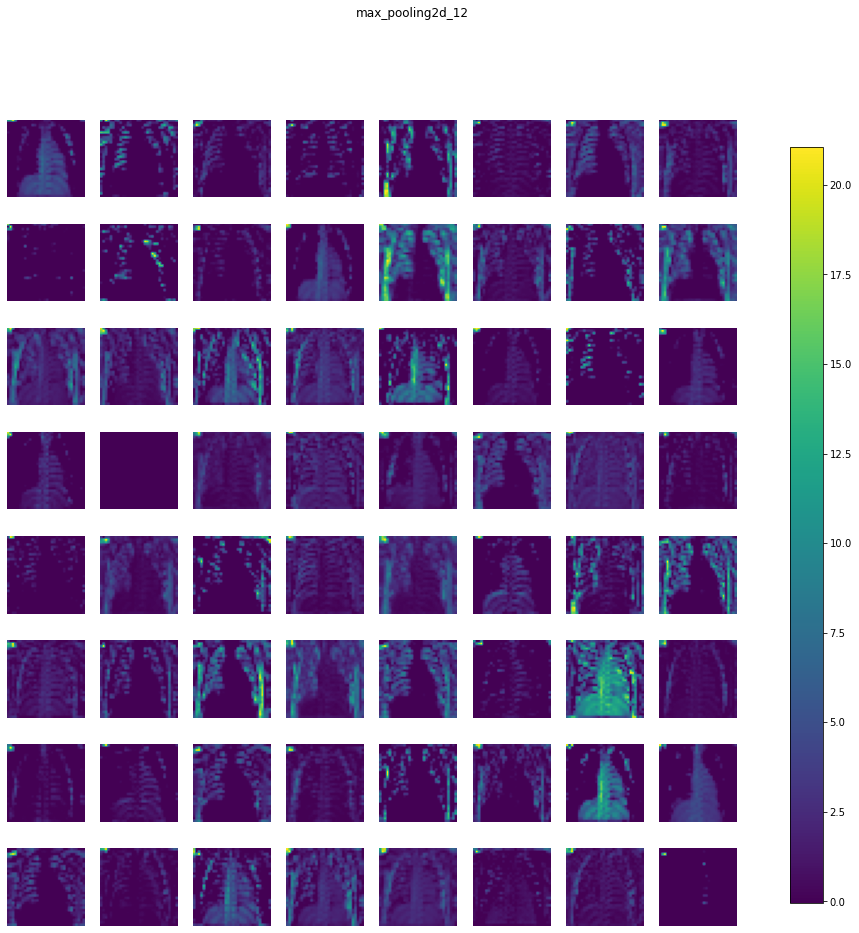

dropout_20 (1, 32, 32, 64) 


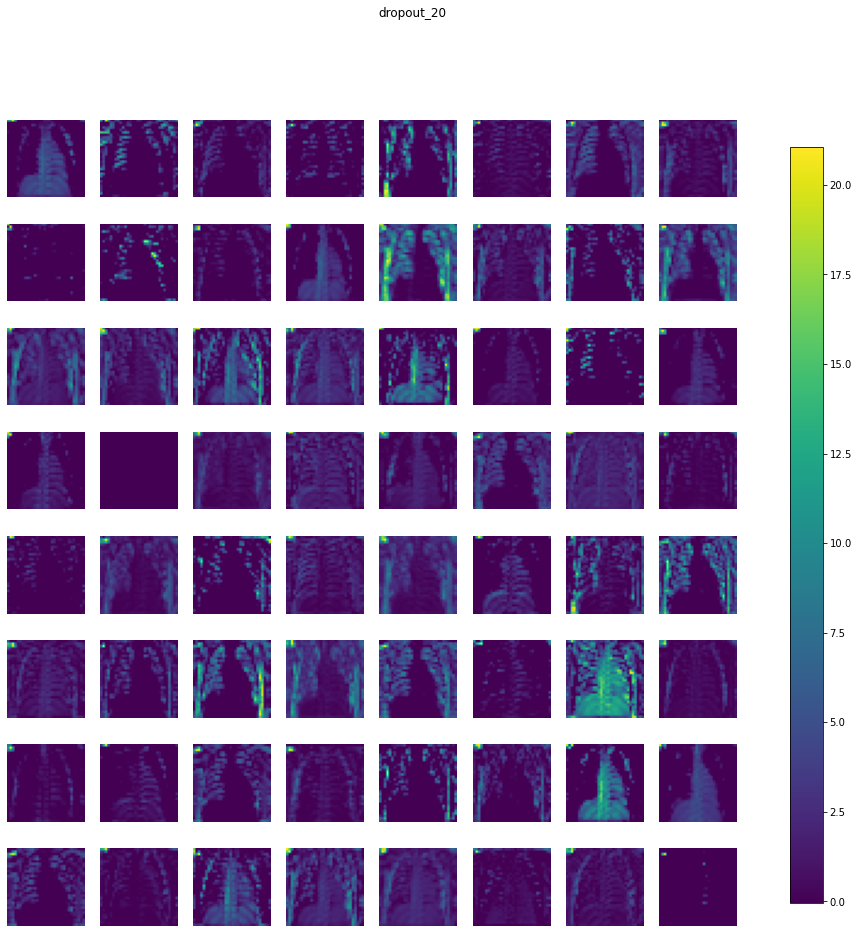

conv2d_26 (1, 32, 32, 128) 


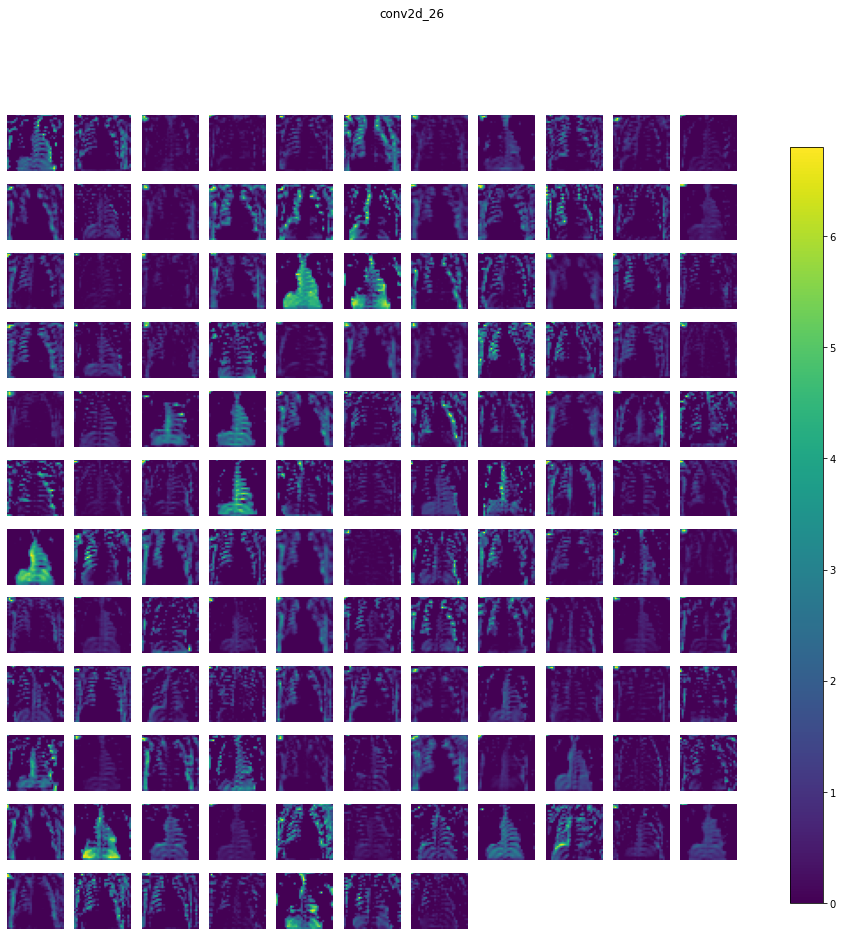

conv2d_27 (1, 32, 32, 128) 


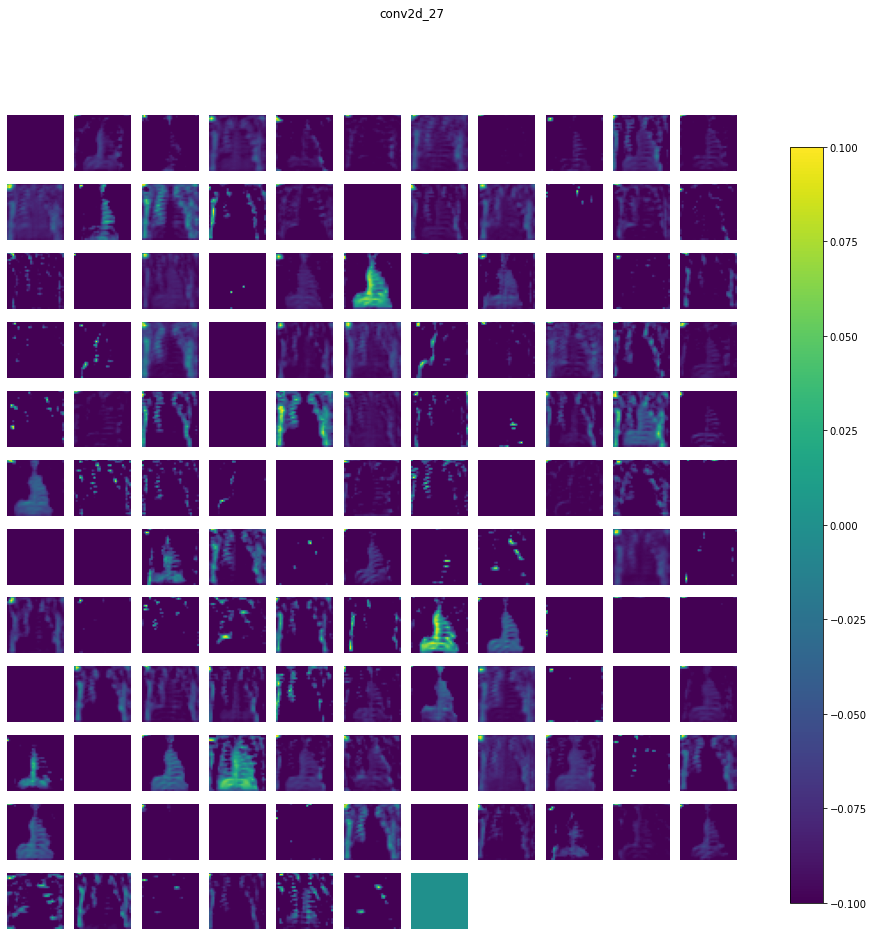

batch_normalization_21 (1, 32, 32, 128) 


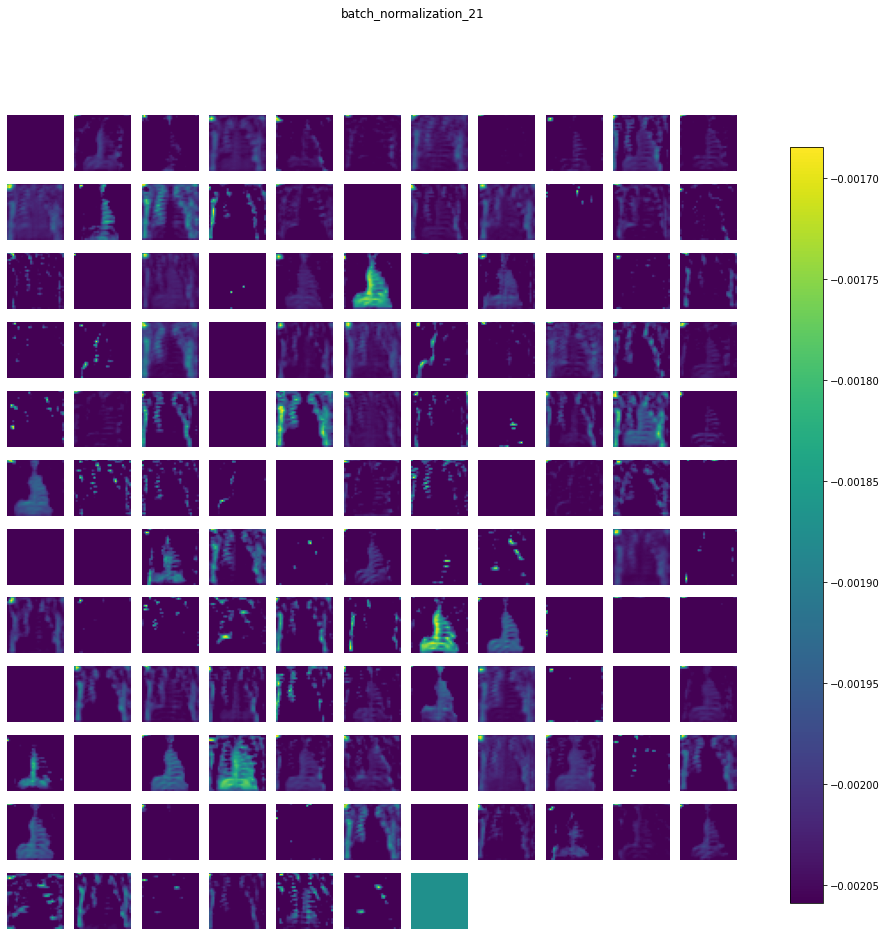

max_pooling2d_13 (1, 16, 16, 128) 


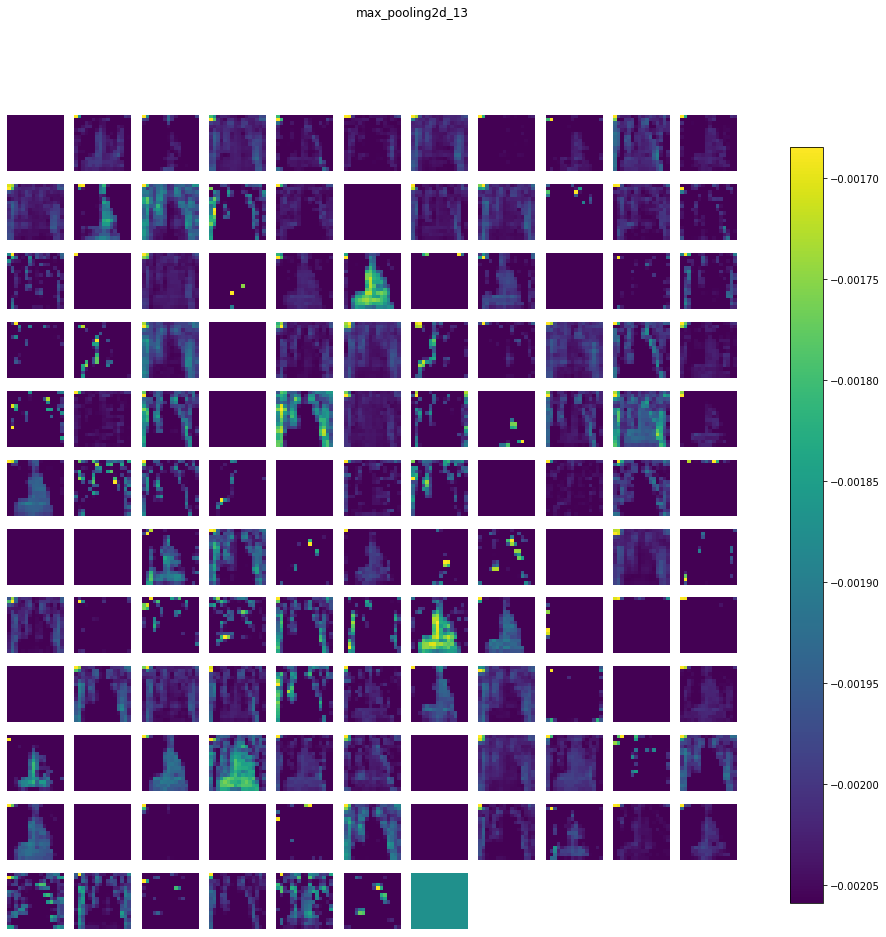

dropout_21 (1, 16, 16, 128) 


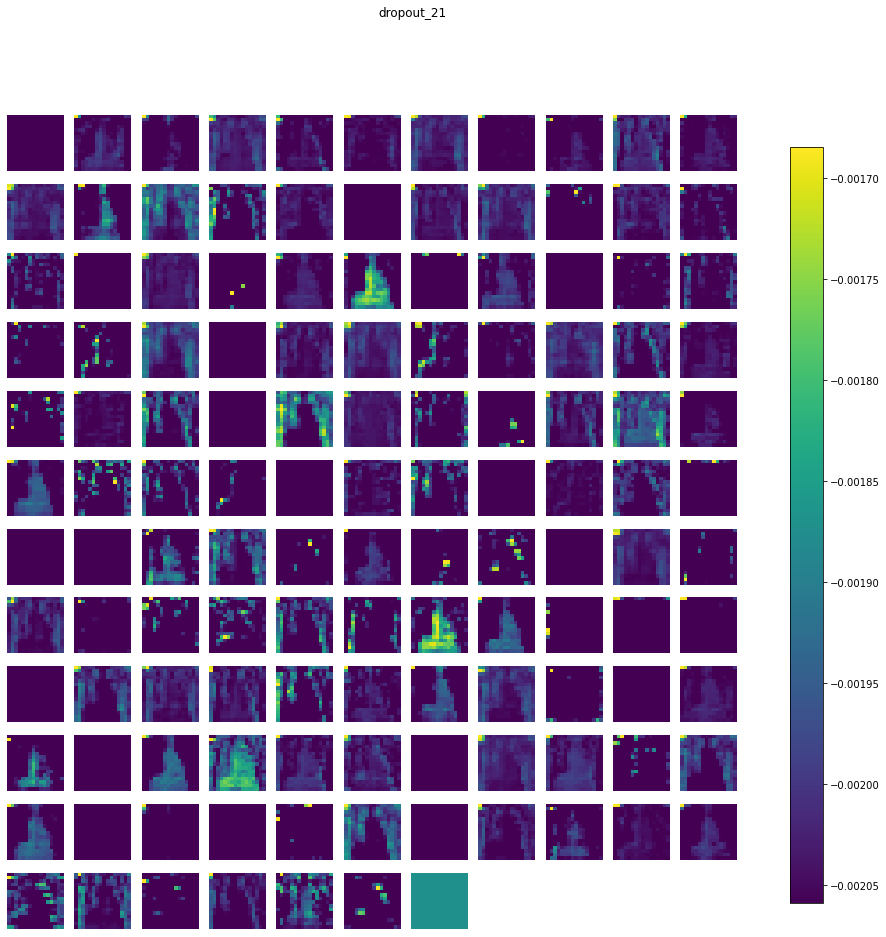

conv2d_28 (1, 16, 16, 256) 


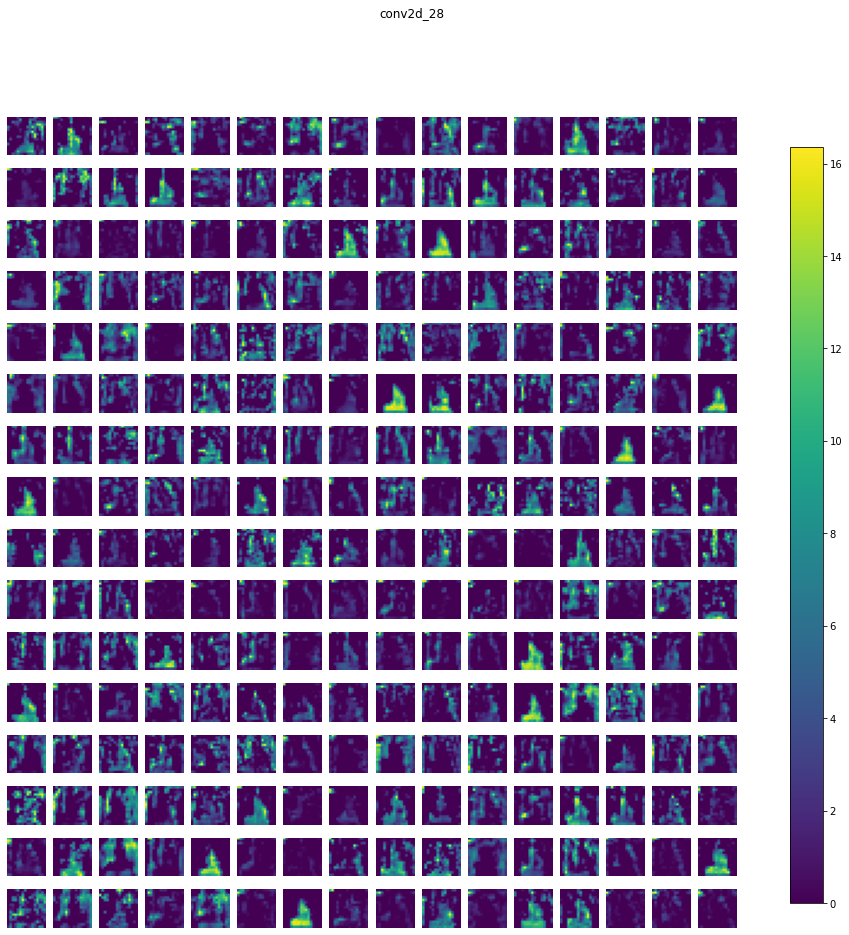

conv2d_29 (1, 16, 16, 256) 


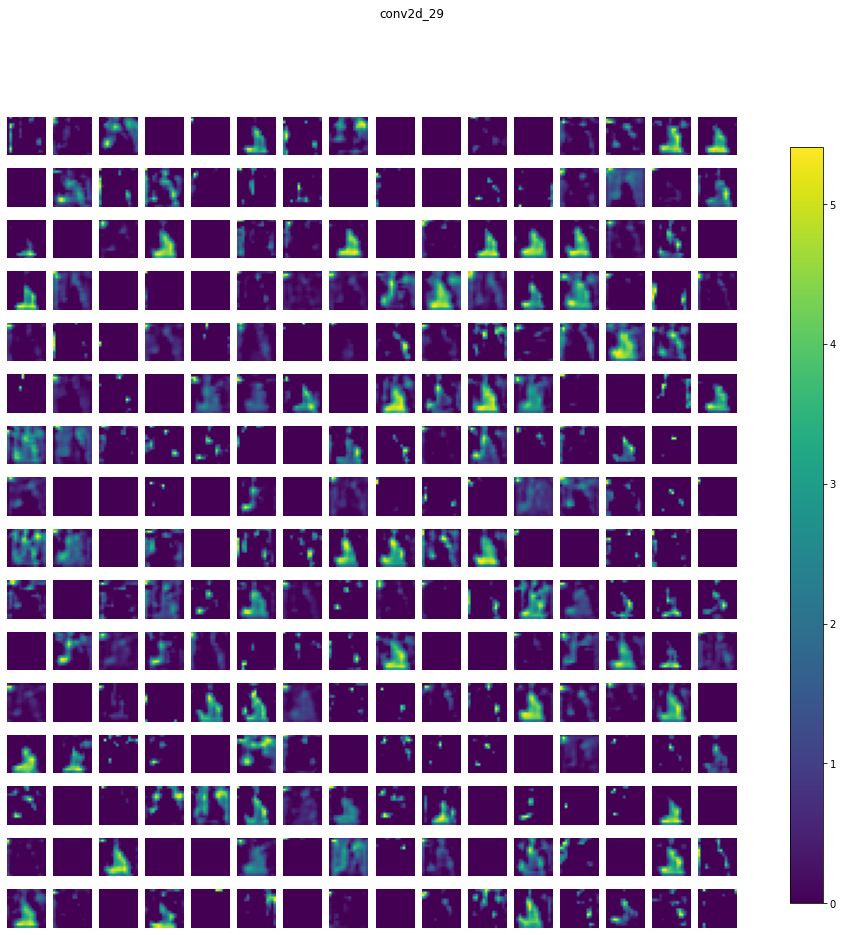

batch_normalization_22 (1, 16, 16, 256) 


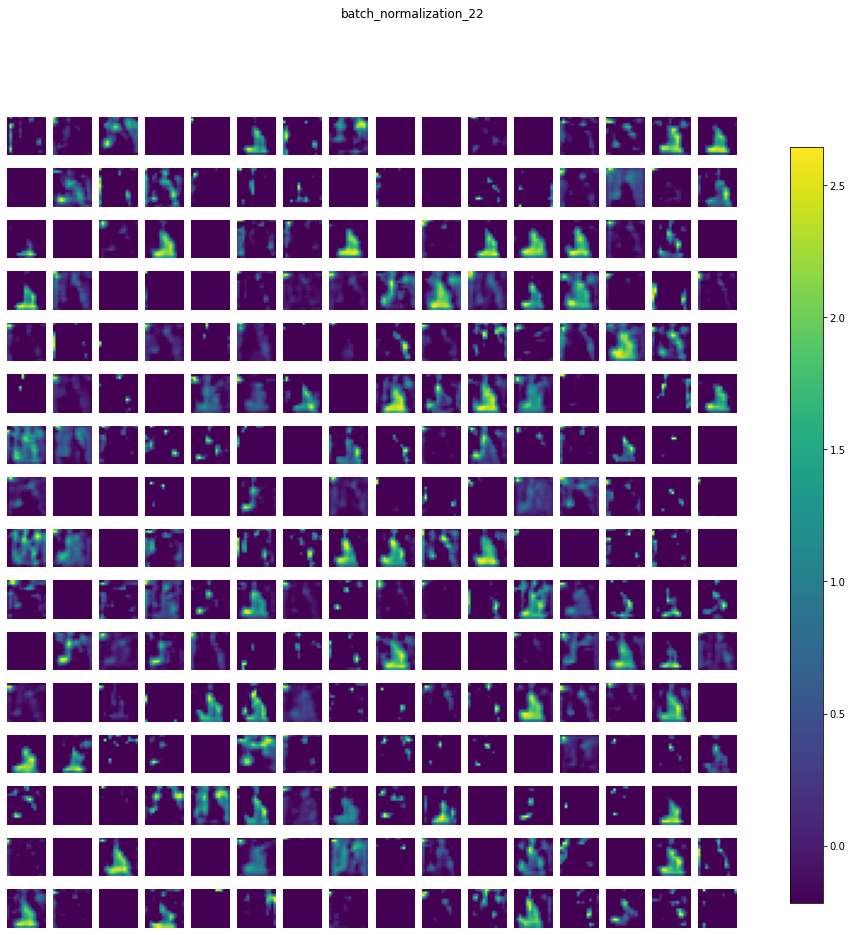

max_pooling2d_14 (1, 8, 8, 256) 


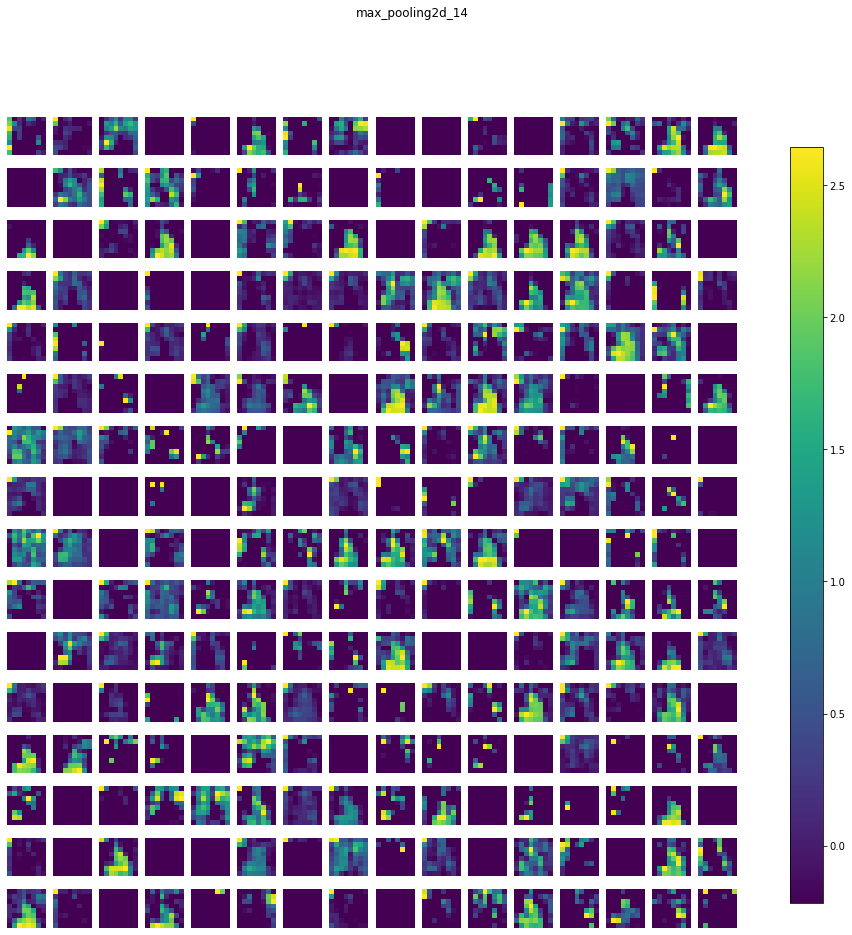

dropout_22 (1, 8, 8, 256) 


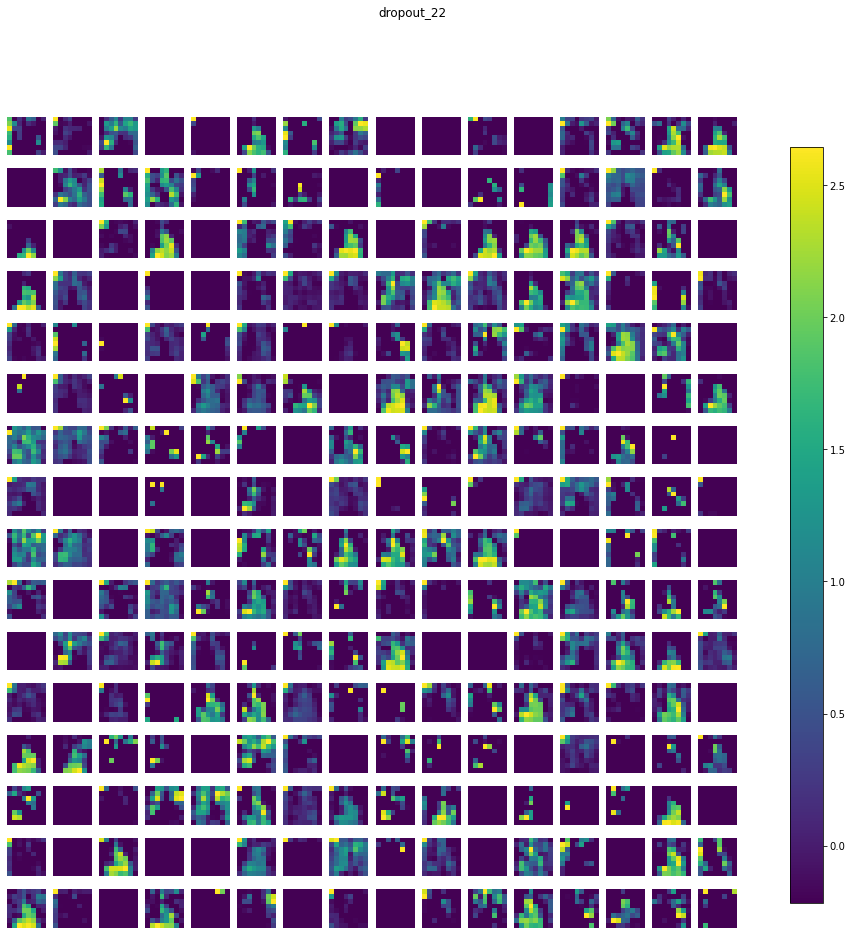

flatten_2 (1, 16384) 


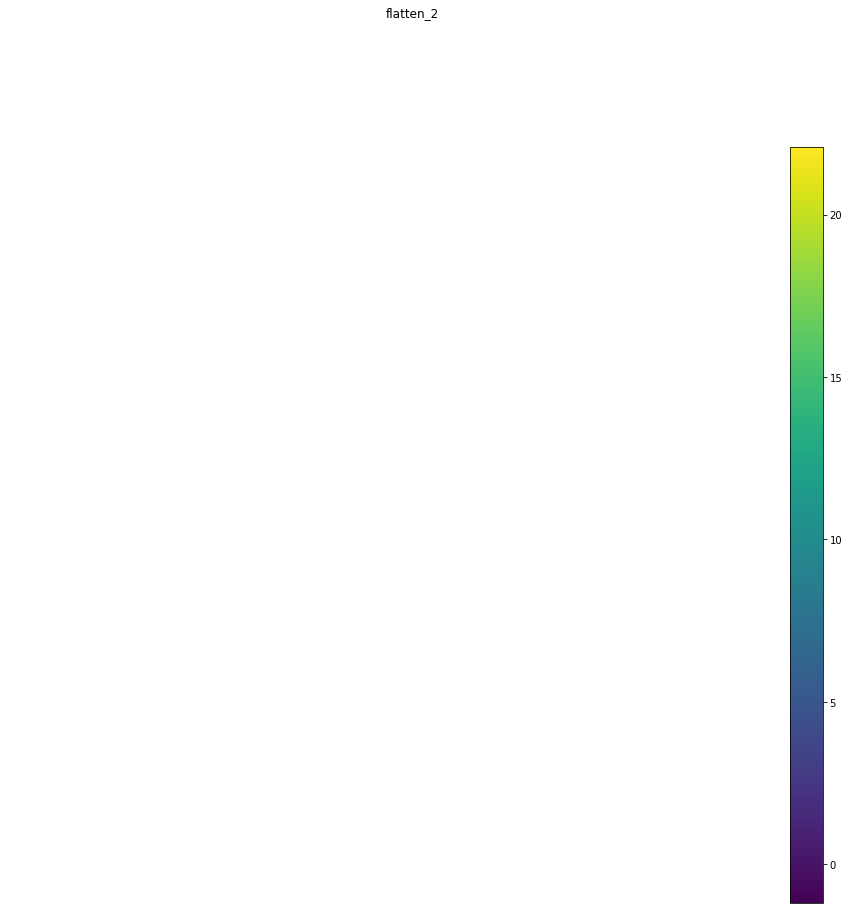

dense_10 (1, 1024) 


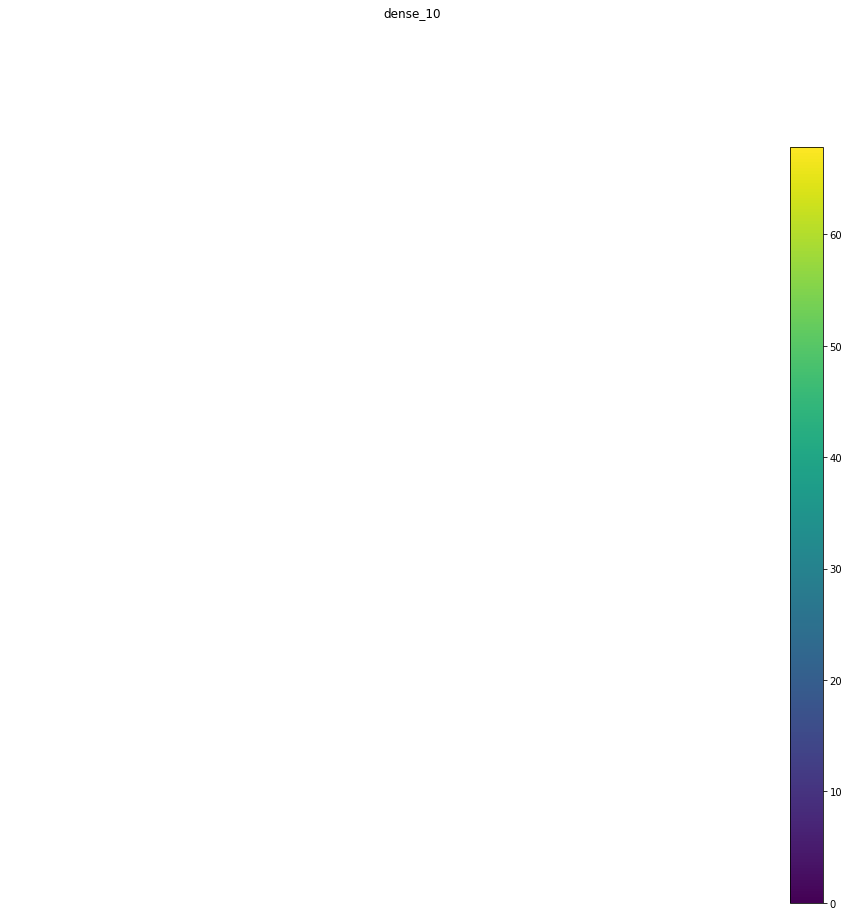

batch_normalization_23 (1, 1024) 


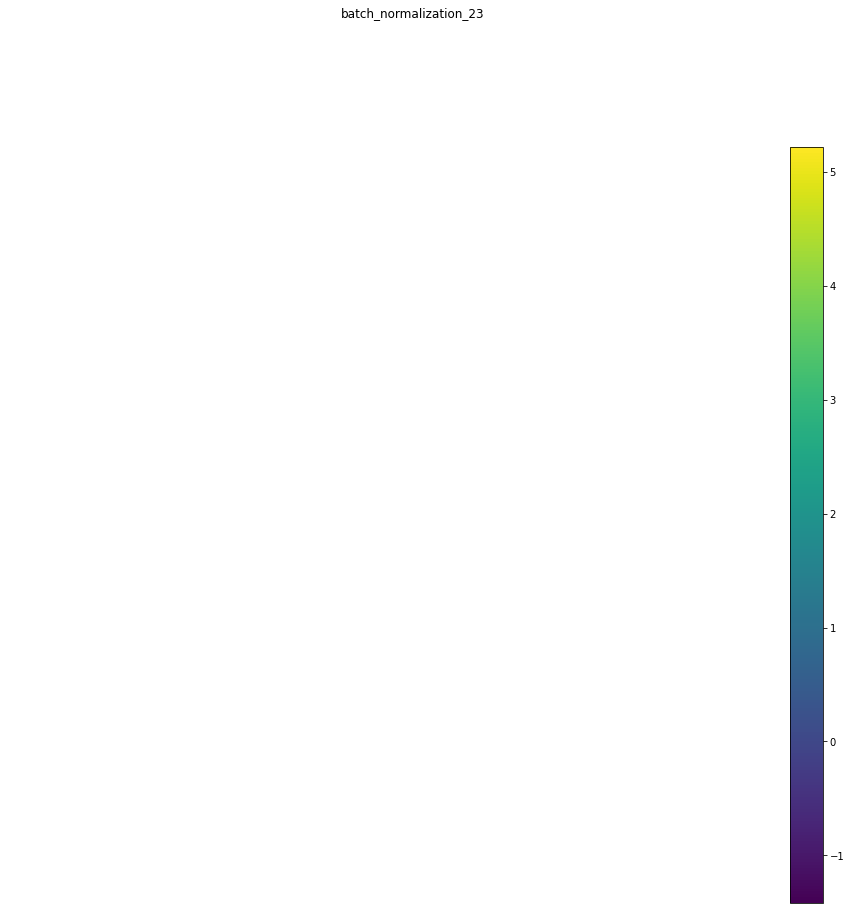

dropout_23 (1, 1024) 


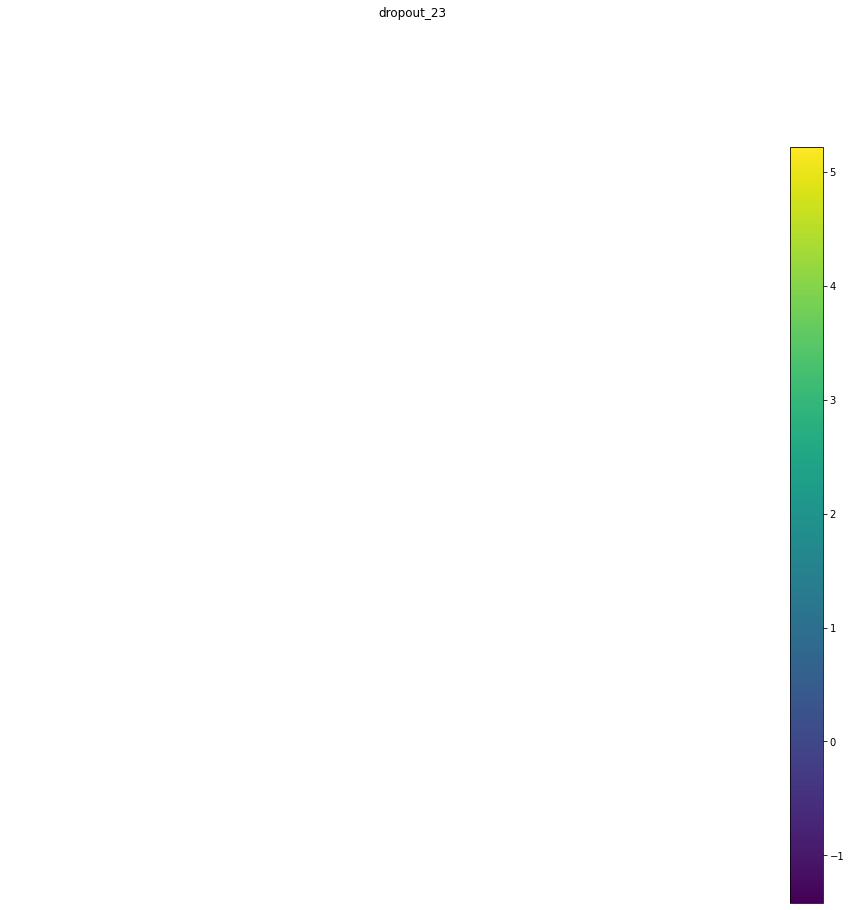

dense_11 (1, 512) 


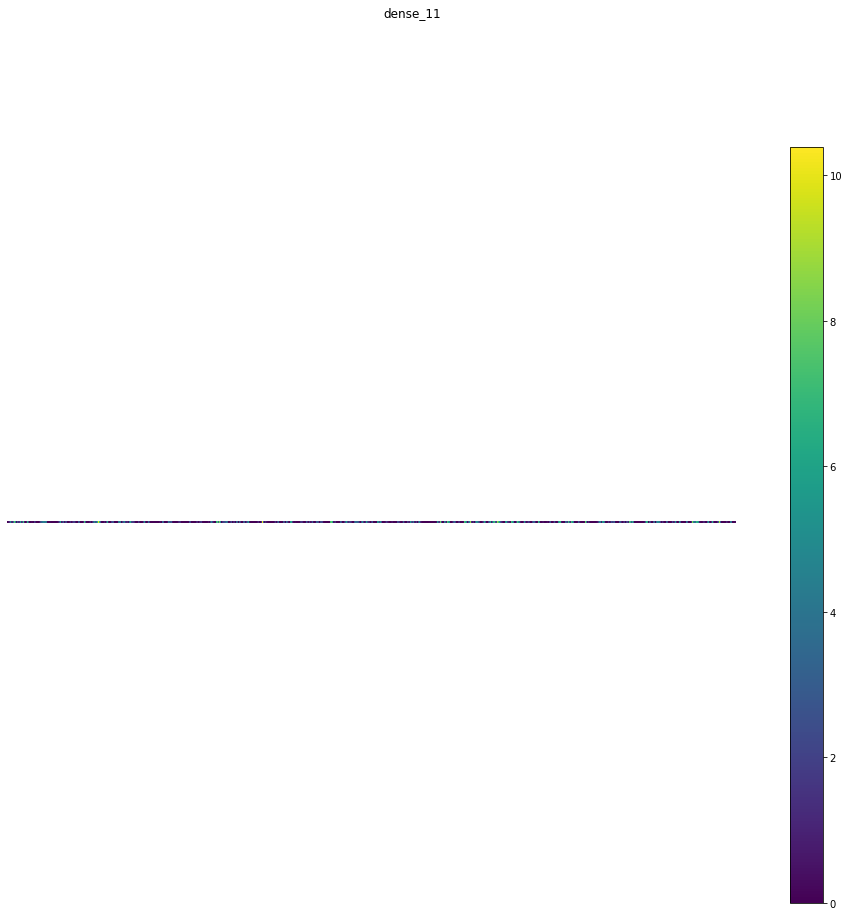

batch_normalization_24 (1, 512) 


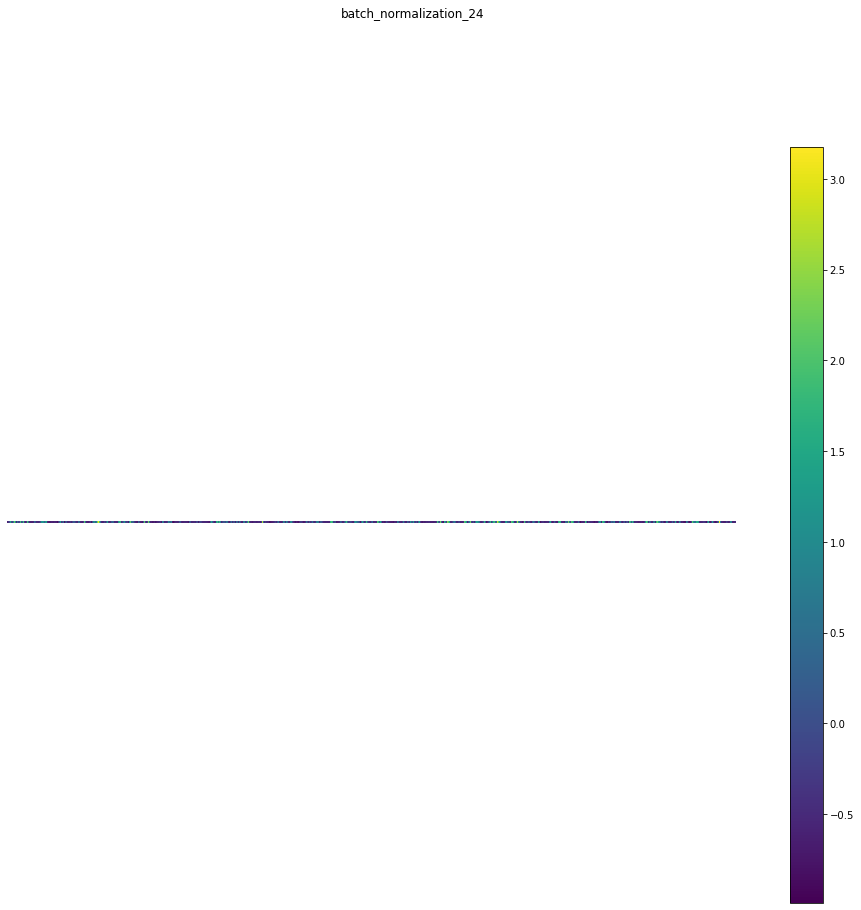

dropout_24 (1, 512) 


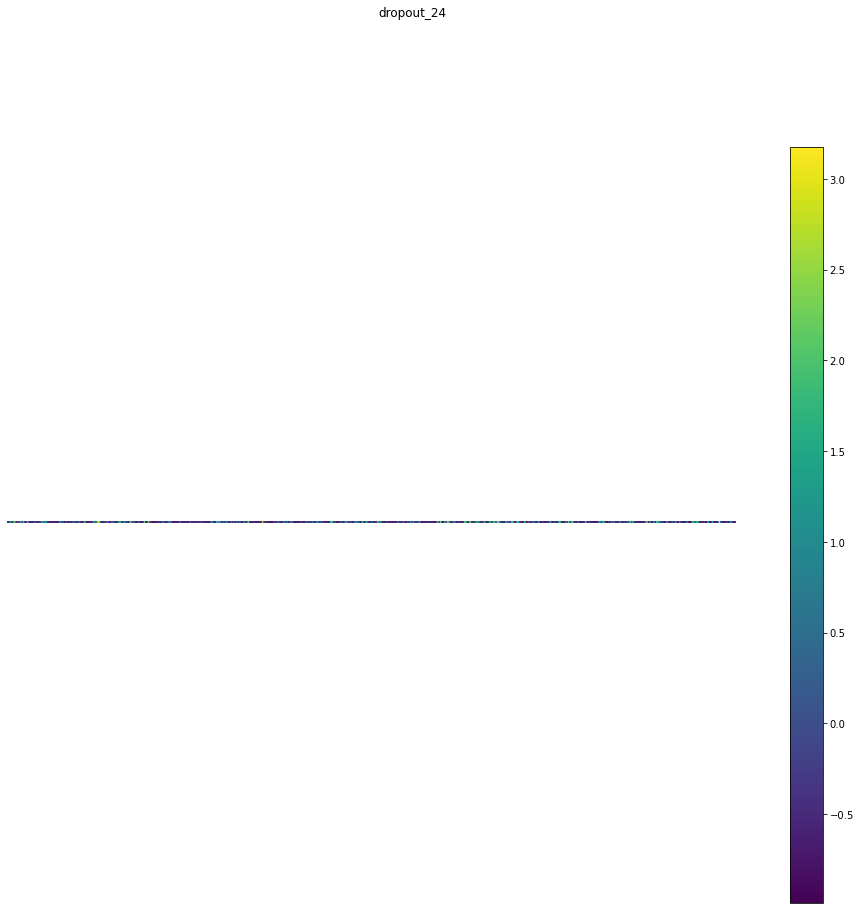

dense_12 (1, 256) 


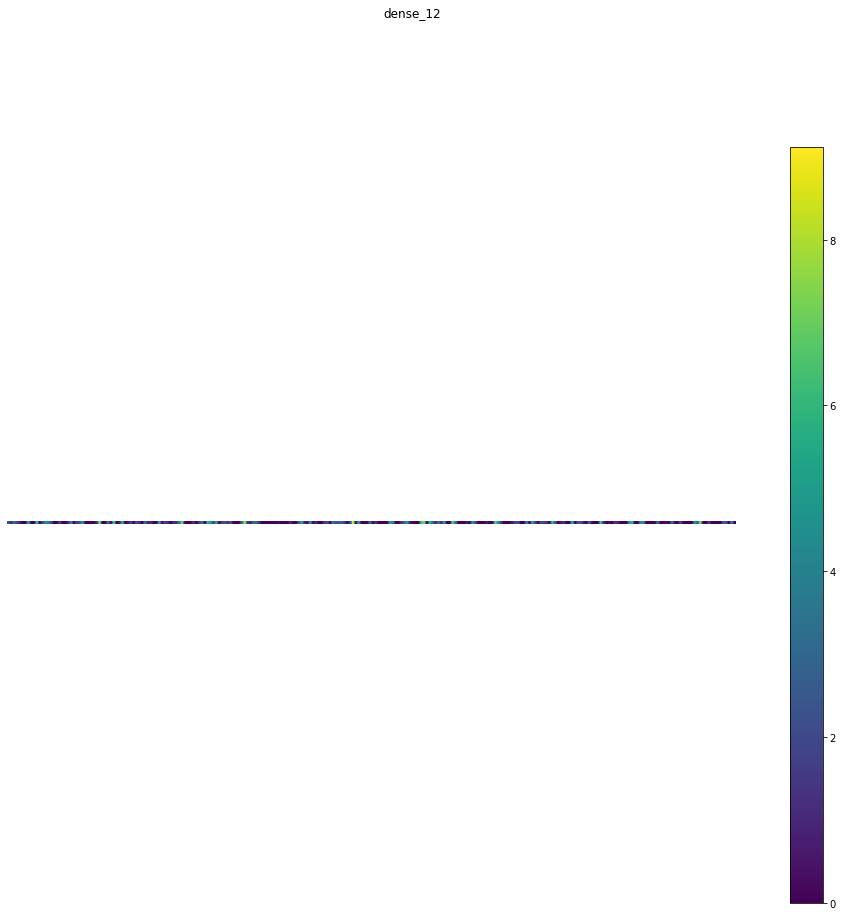

batch_normalization_25 (1, 256) 


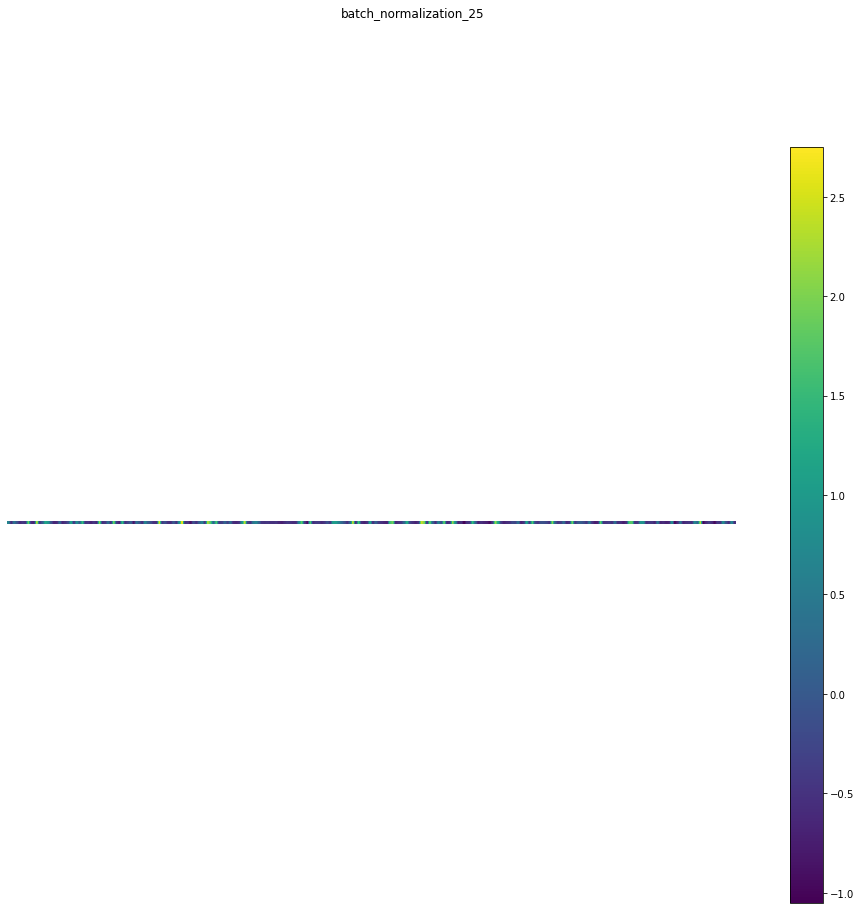

dropout_25 (1, 256) 


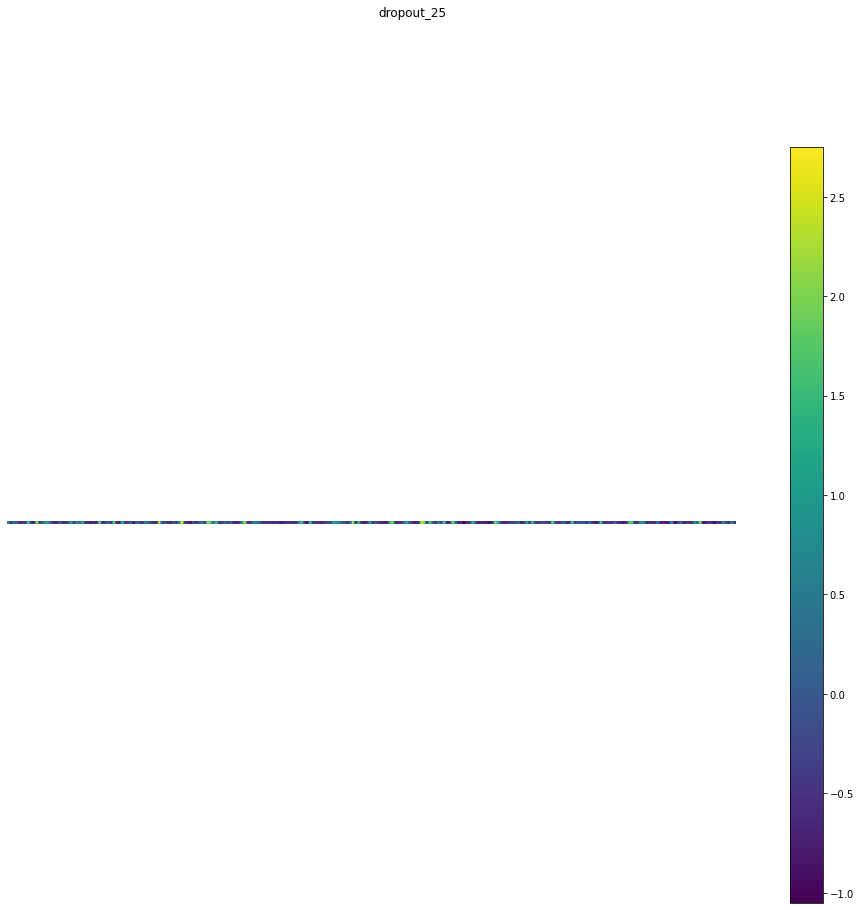

dense_13 (1, 64) 


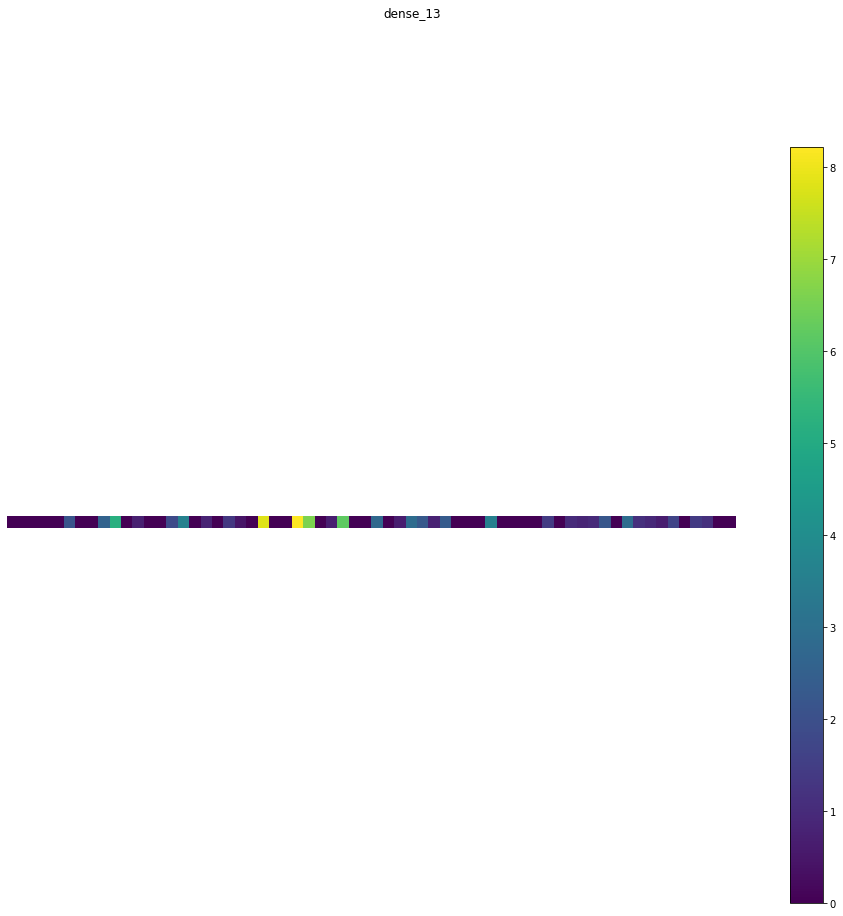

batch_normalization_26 (1, 64) 


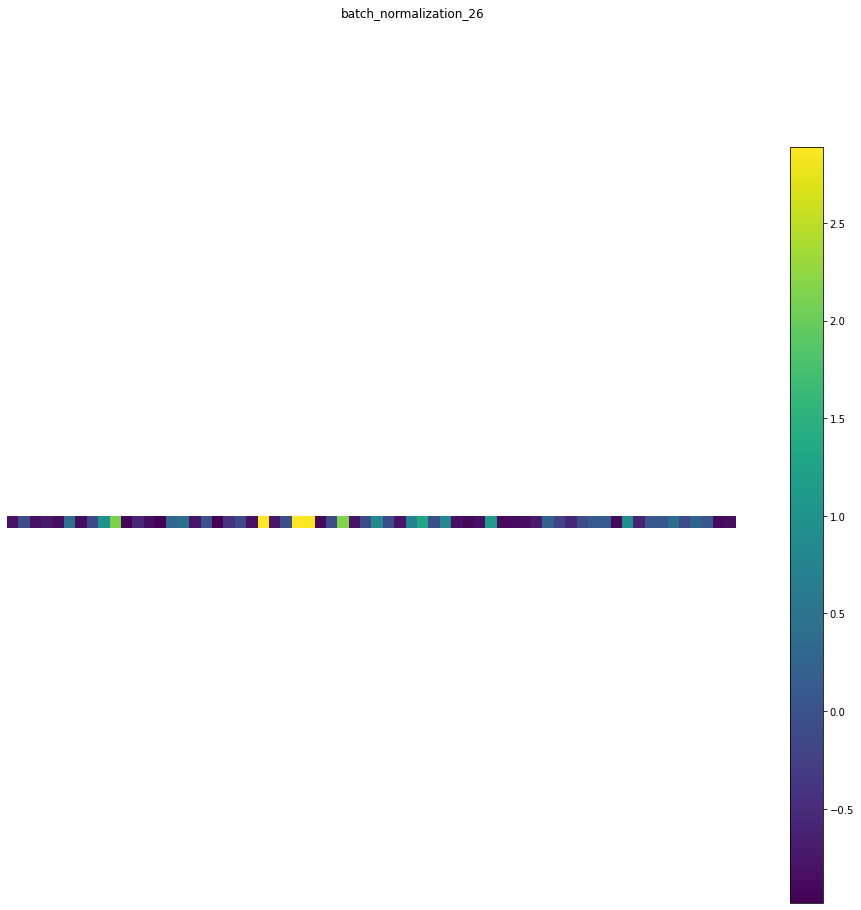

dropout_26 (1, 64) 


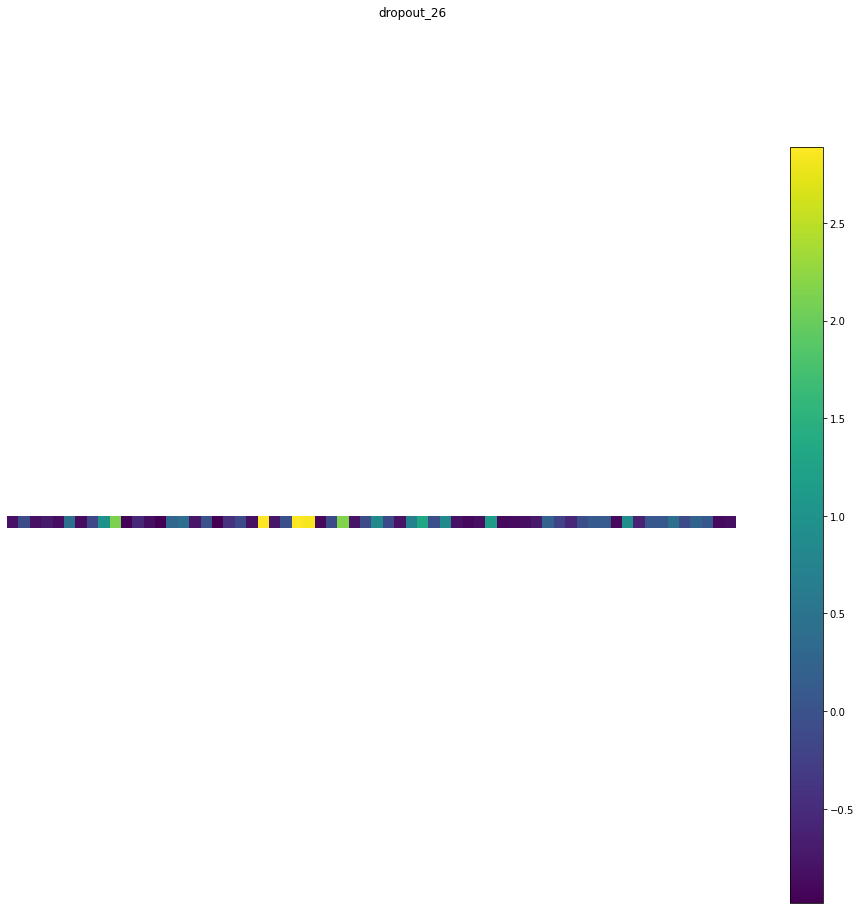

dense_14 (1, 1) 


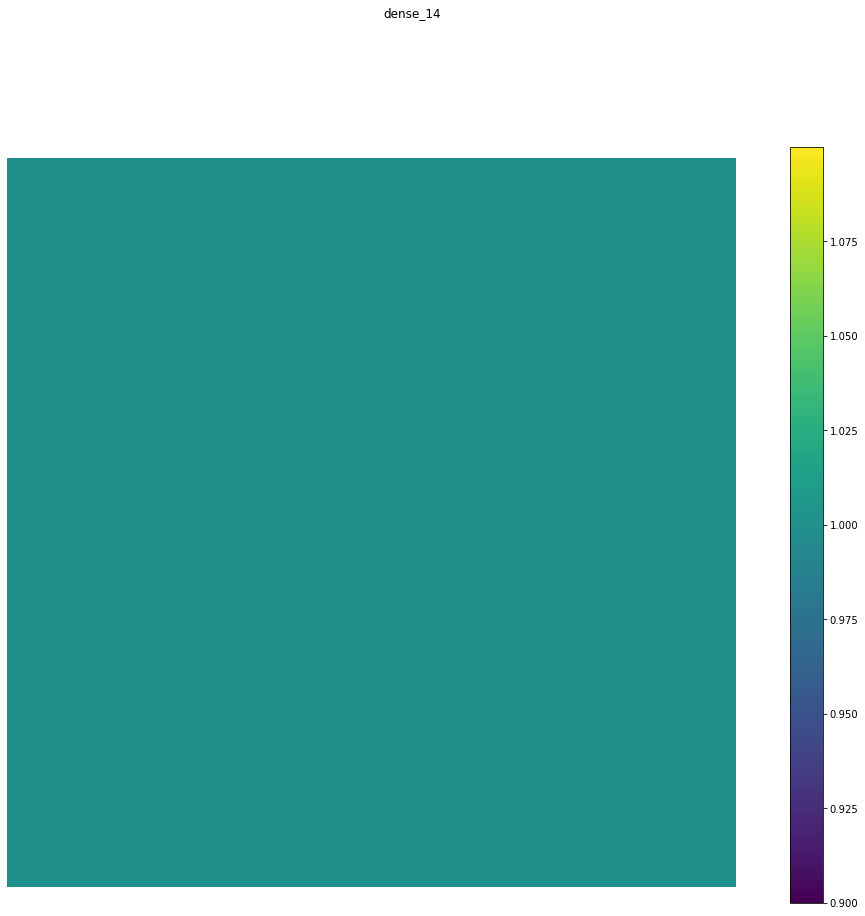

In [33]:
# visualising each layer of the model
from keract import get_activations, display_activations
keract_inputs = test_images[:1]
keract_targets = test_labels[:1]
activations = get_activations(new_model, keract_inputs)
display_activations(activations, cmap="viridis", save=False,fig_size=(15, 15))

conv2d_20_input (1, 256, 256, 3) 


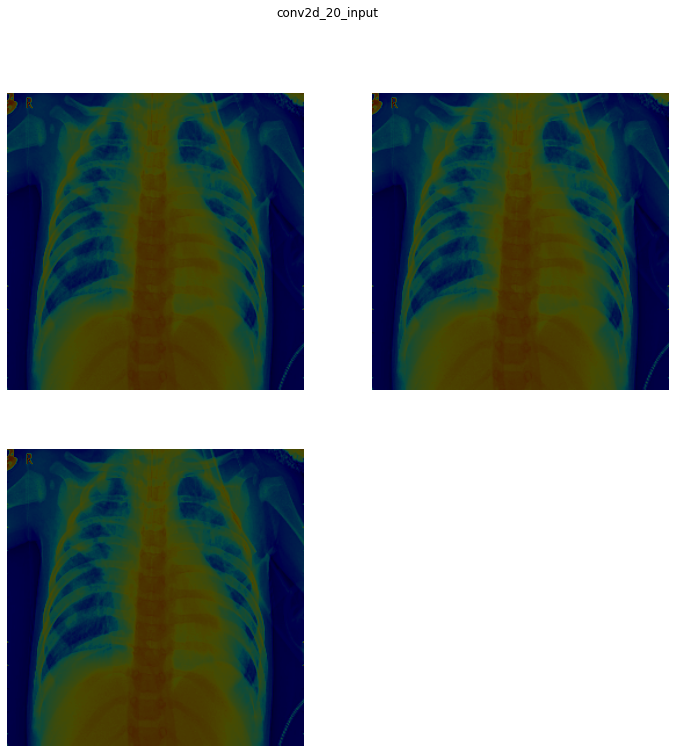

conv2d_20 (1, 256, 256, 16) 


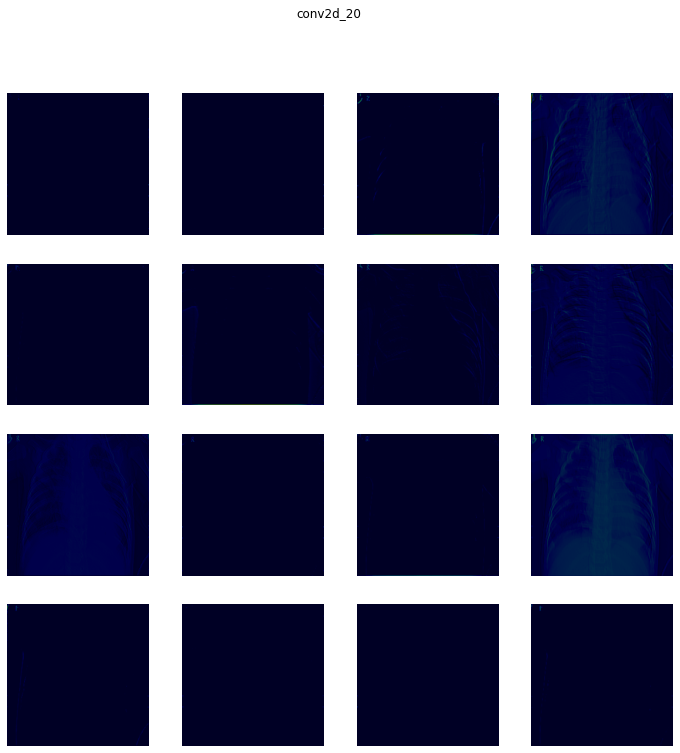

conv2d_21 (1, 256, 256, 16) 


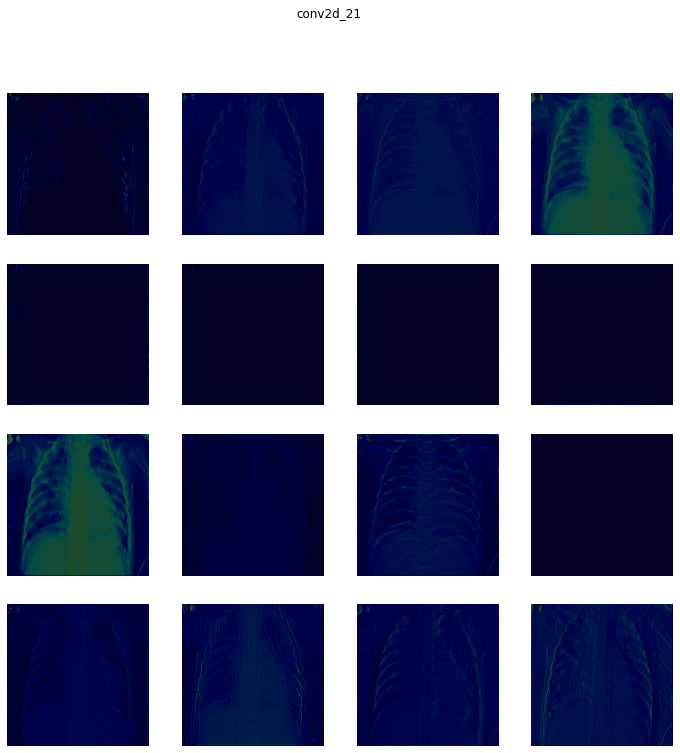

batch_normalization_18 (1, 256, 256, 16) 


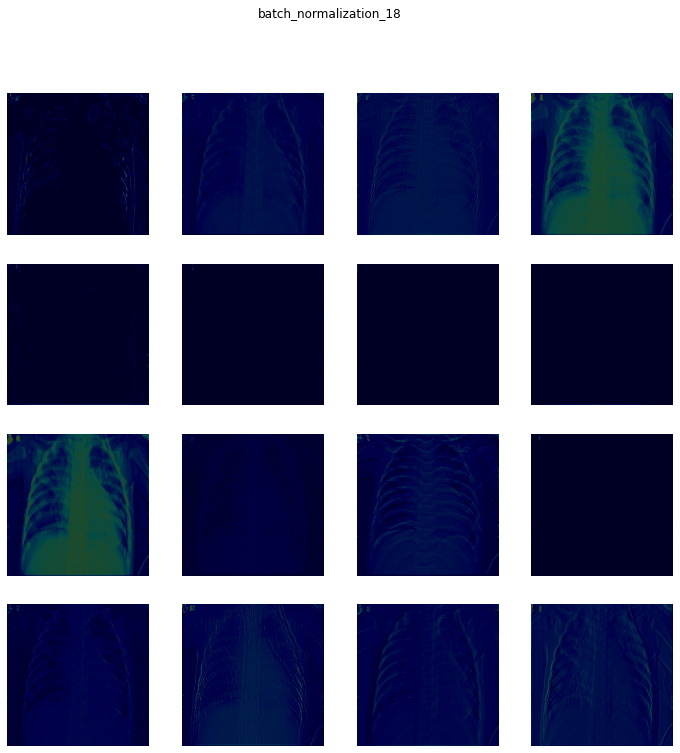

max_pooling2d_10 (1, 128, 128, 16) 


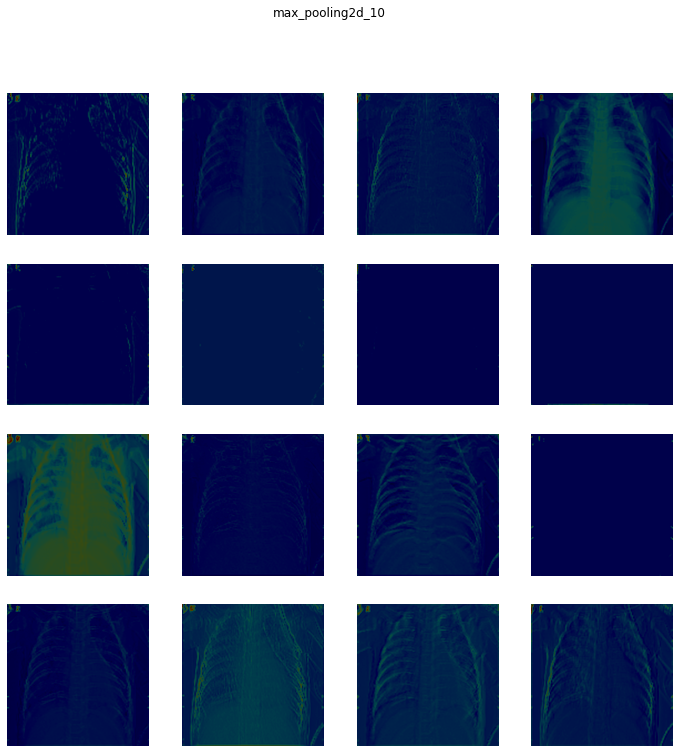

dropout_18 (1, 128, 128, 16) 


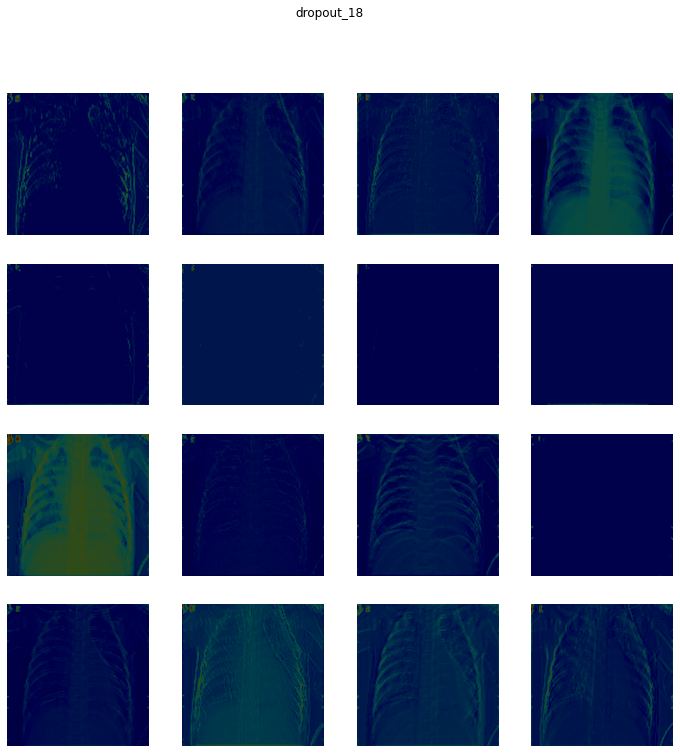

conv2d_22 (1, 128, 128, 32) 


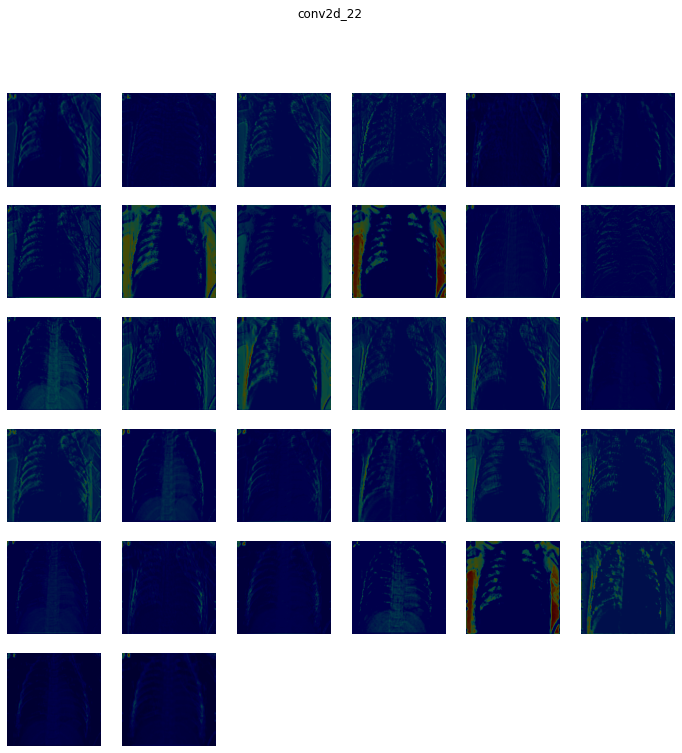

conv2d_23 (1, 128, 128, 32) 


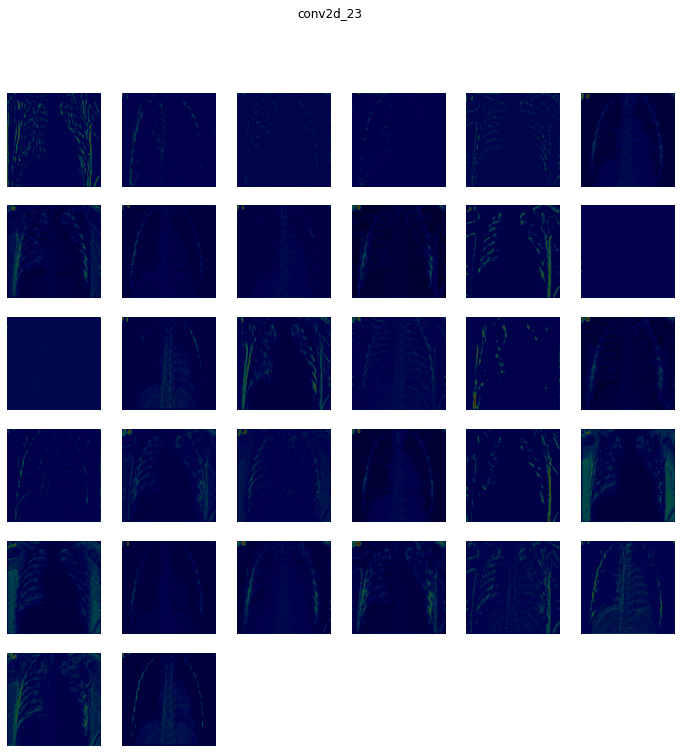

batch_normalization_19 (1, 128, 128, 32) 


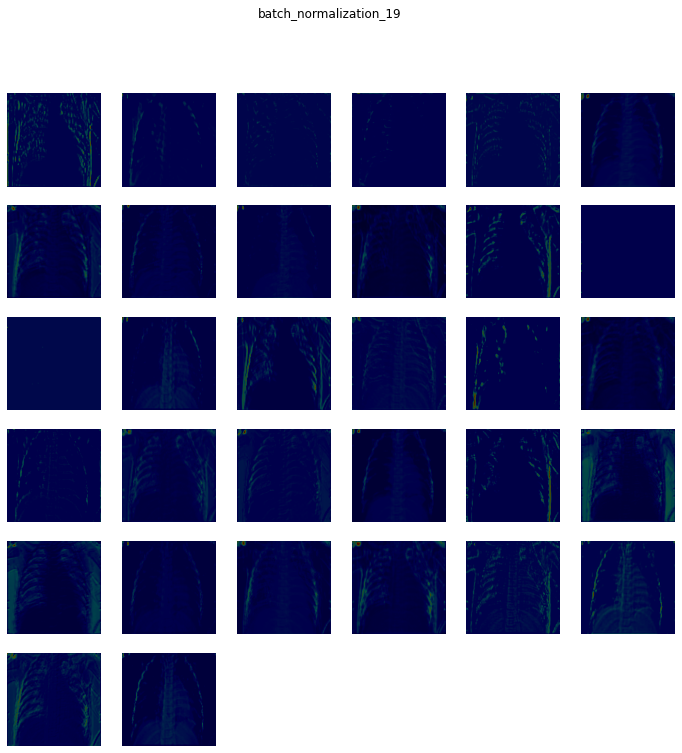

max_pooling2d_11 (1, 64, 64, 32) 


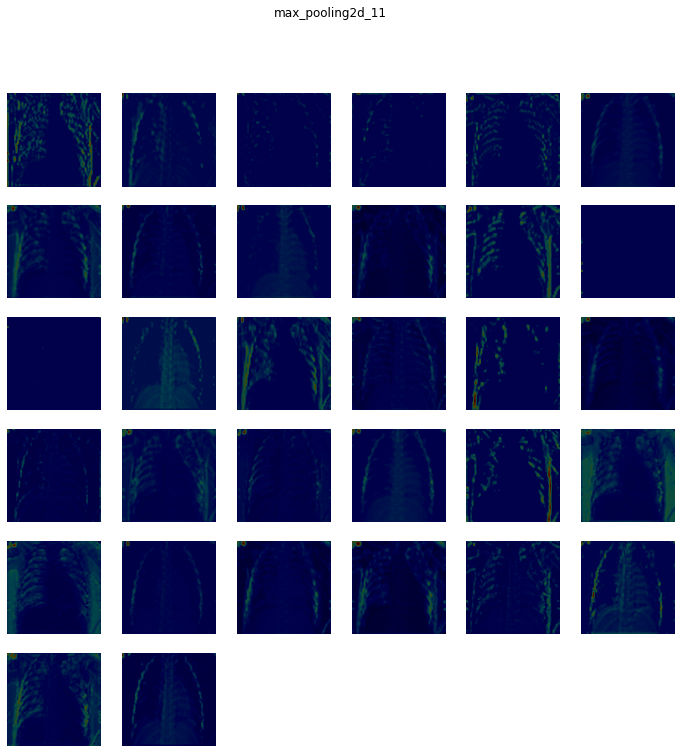

dropout_19 (1, 64, 64, 32) 


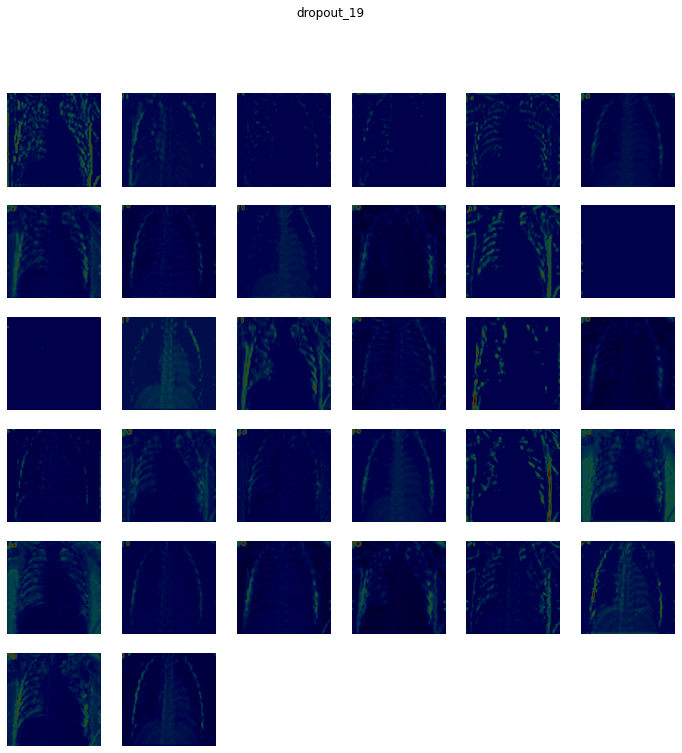

conv2d_24 (1, 64, 64, 64) 


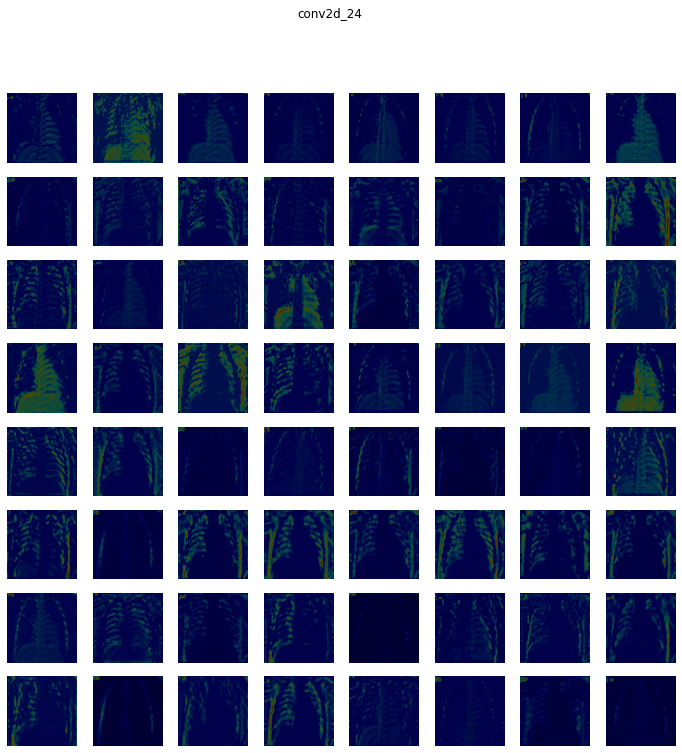

conv2d_25 (1, 64, 64, 64) 


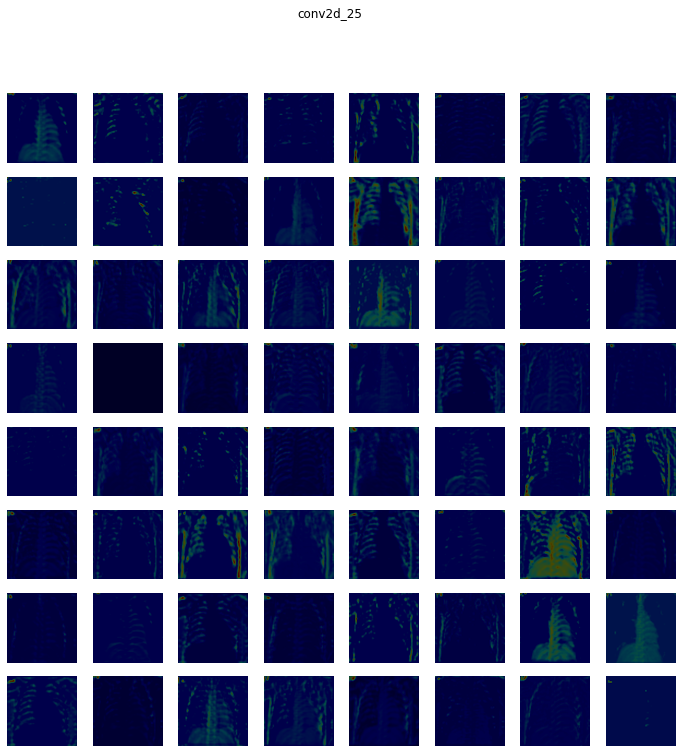

batch_normalization_20 (1, 64, 64, 64) 


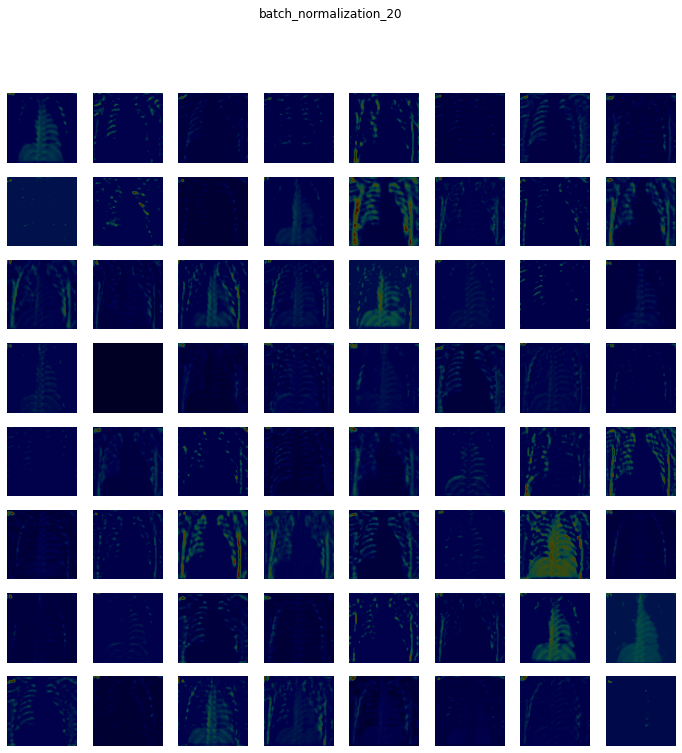

max_pooling2d_12 (1, 32, 32, 64) 


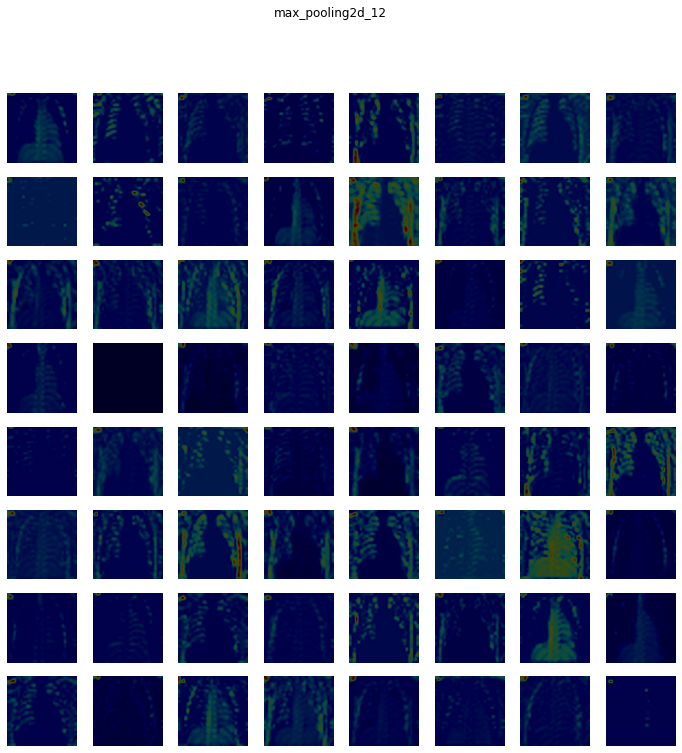

dropout_20 (1, 32, 32, 64) 


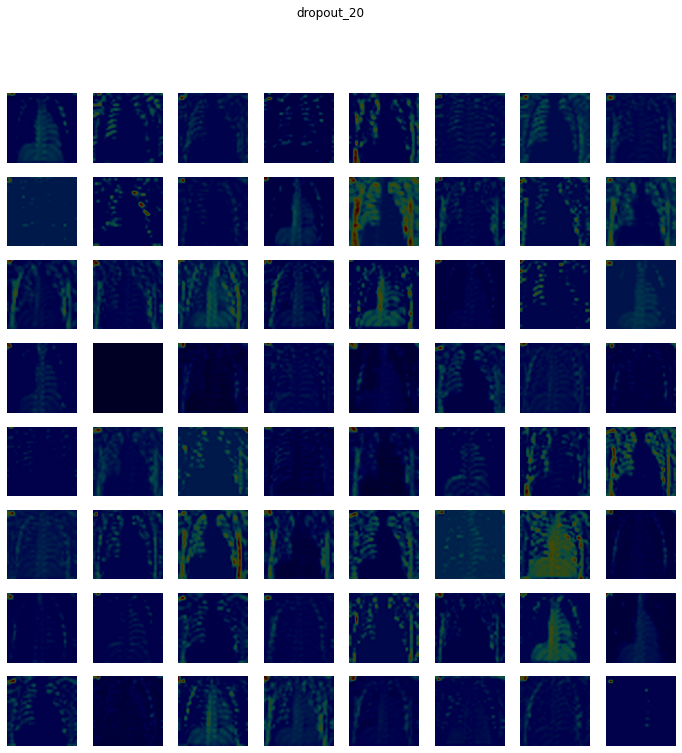

conv2d_26 (1, 32, 32, 128) 


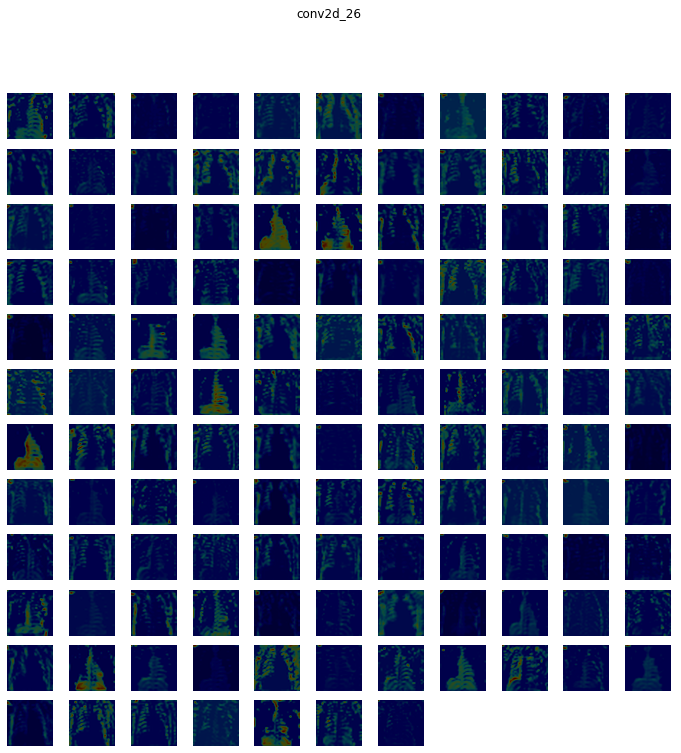

conv2d_27 (1, 32, 32, 128) 


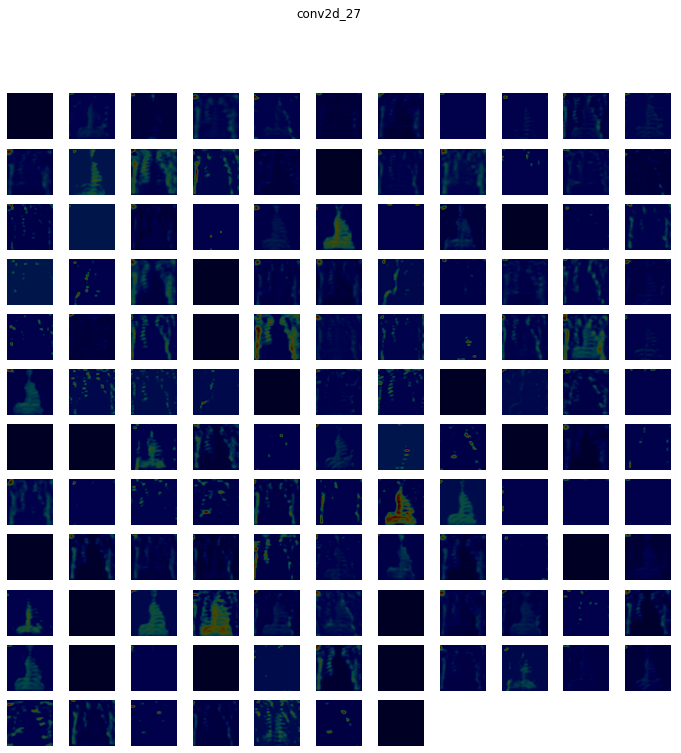

batch_normalization_21 (1, 32, 32, 128) 


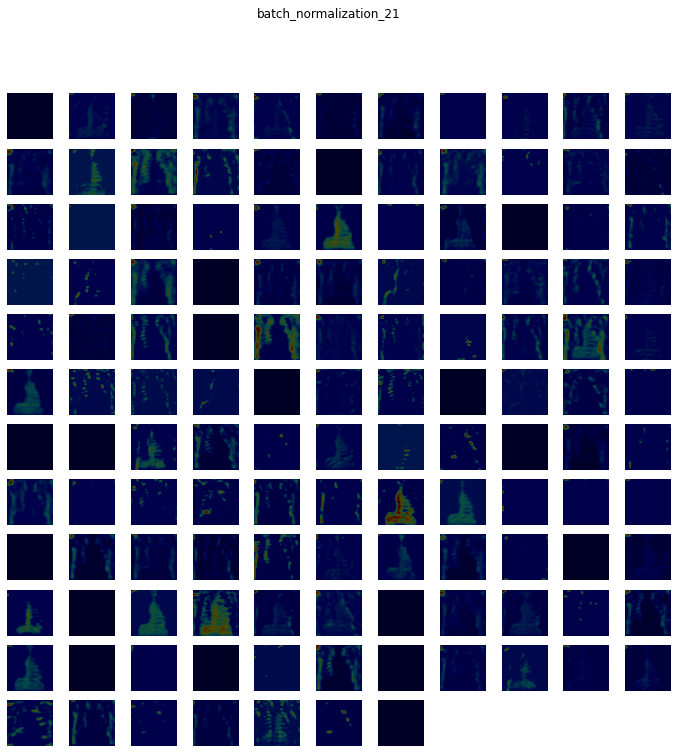

max_pooling2d_13 (1, 16, 16, 128) 


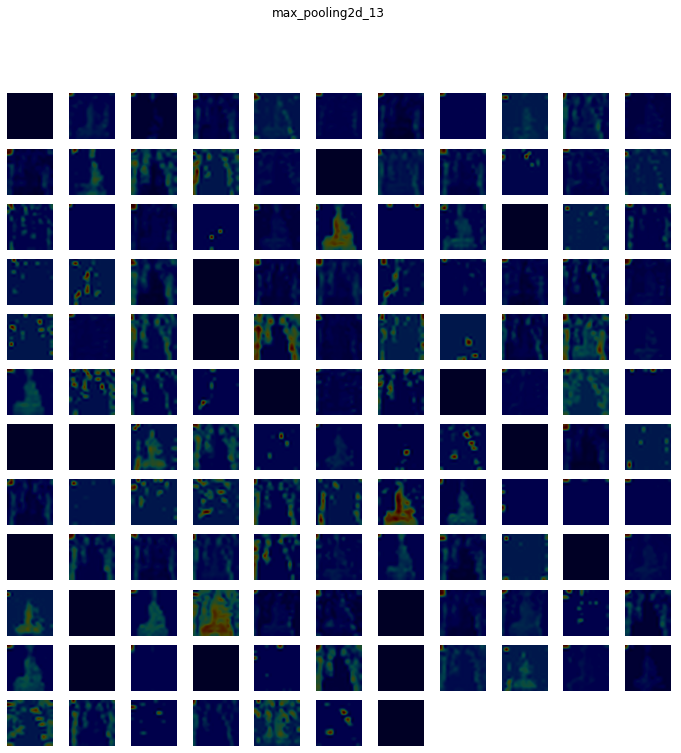

dropout_21 (1, 16, 16, 128) 


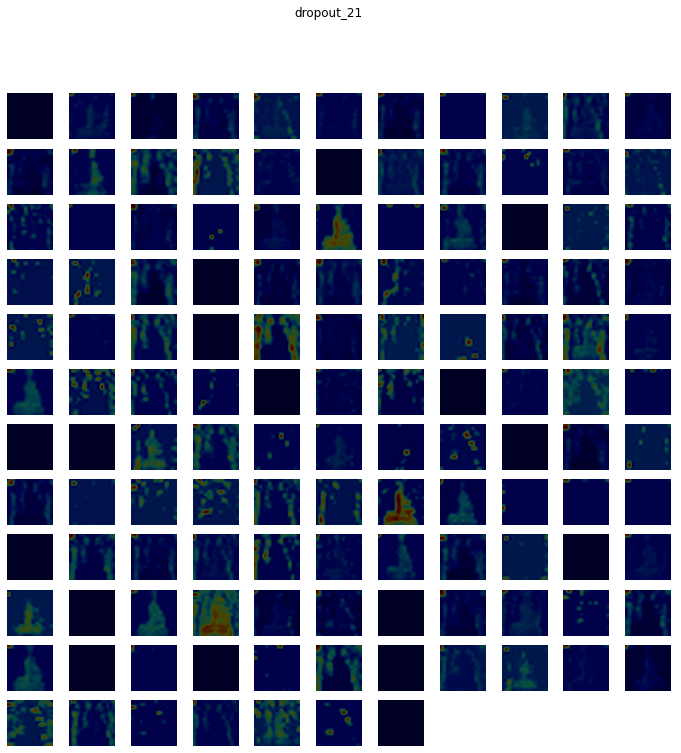

conv2d_28 (1, 16, 16, 256) 


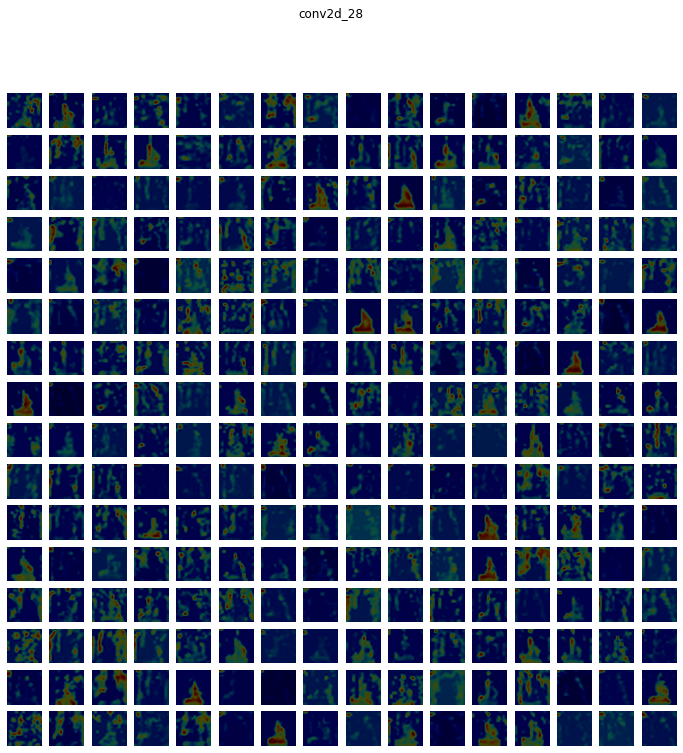

conv2d_29 (1, 16, 16, 256) 


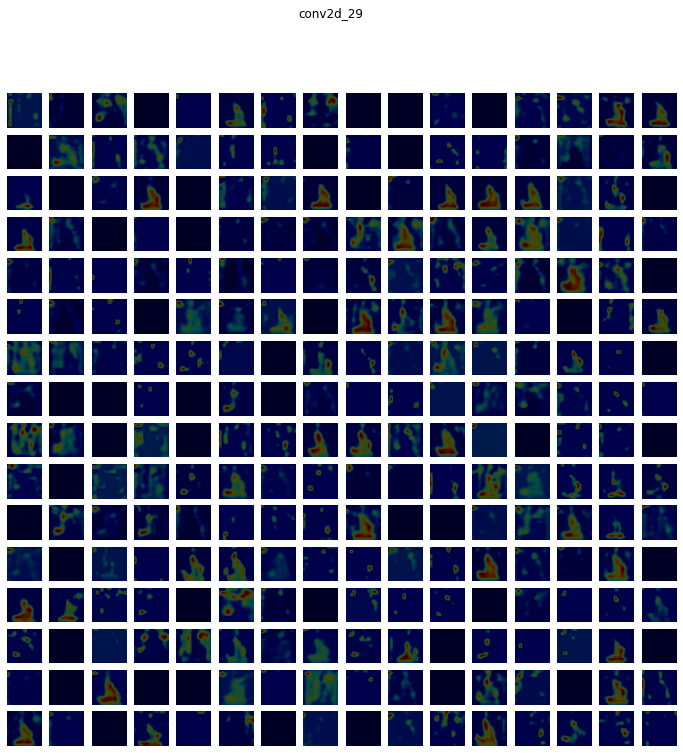

batch_normalization_22 (1, 16, 16, 256) 


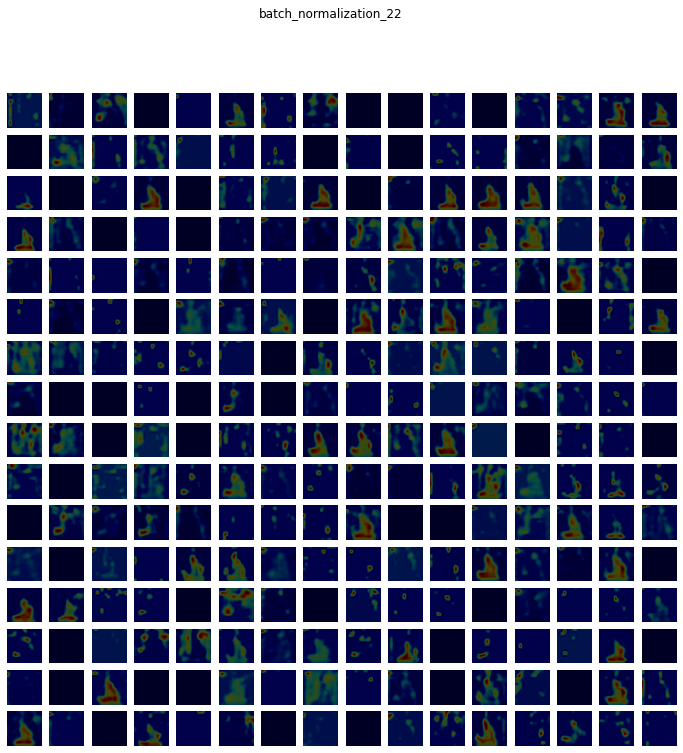

max_pooling2d_14 (1, 8, 8, 256) 


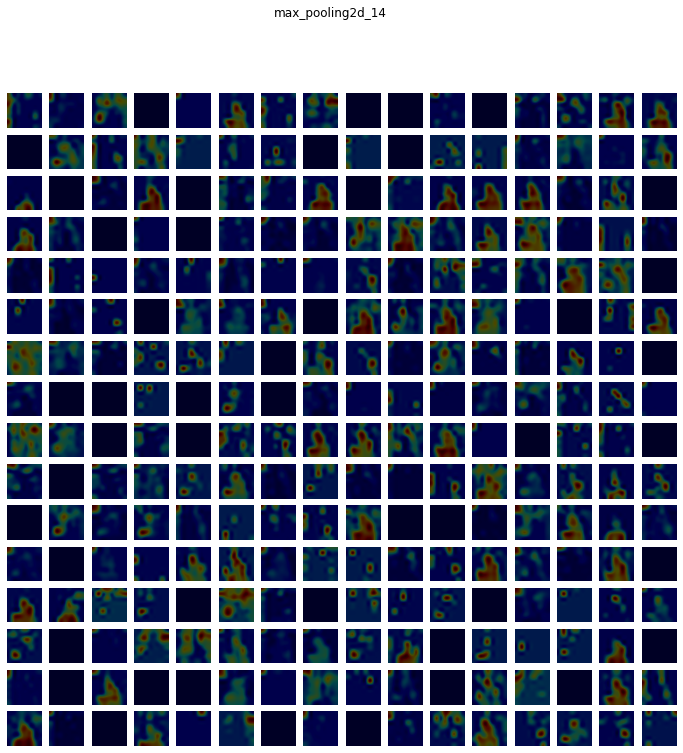

dropout_22 (1, 8, 8, 256) 


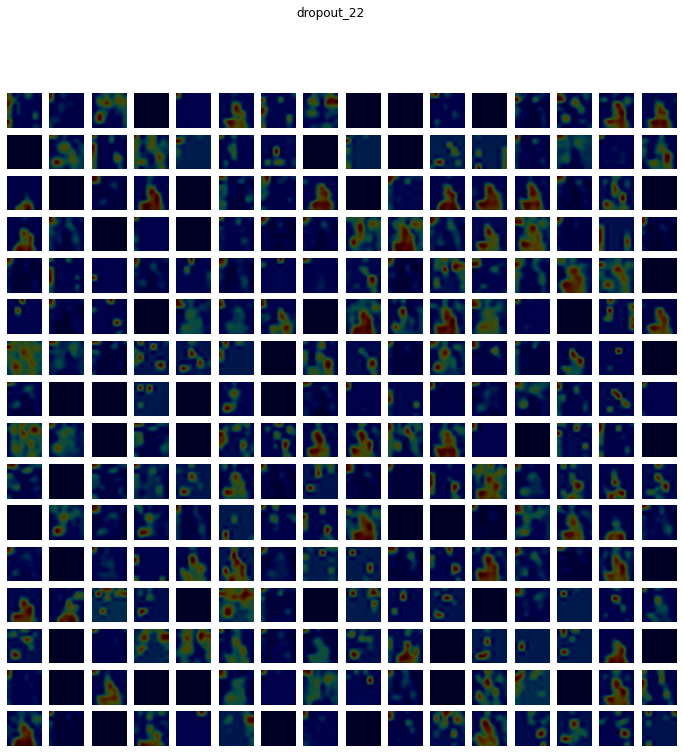

flatten_2 (1, 16384) -> Skipped. 2D Activations.
dense_10 (1, 1024) -> Skipped. 2D Activations.
batch_normalization_23 (1, 1024) -> Skipped. 2D Activations.
dropout_23 (1, 1024) -> Skipped. 2D Activations.
dense_11 (1, 512) -> Skipped. 2D Activations.
batch_normalization_24 (1, 512) -> Skipped. 2D Activations.
dropout_24 (1, 512) -> Skipped. 2D Activations.
dense_12 (1, 256) -> Skipped. 2D Activations.
batch_normalization_25 (1, 256) -> Skipped. 2D Activations.
dropout_25 (1, 256) -> Skipped. 2D Activations.
dense_13 (1, 64) -> Skipped. 2D Activations.
batch_normalization_26 (1, 64) -> Skipped. 2D Activations.
dropout_26 (1, 64) -> Skipped. 2D Activations.
dense_14 (1, 1) -> Skipped. 2D Activations.


In [34]:
from keract import get_activations, display_heatmaps
keract_inputs = test_images[:1]
keract_targets = test_labels[:1]
activations = get_activations(new_model, keract_inputs)
display_heatmaps(activations, keract_inputs, save=False)

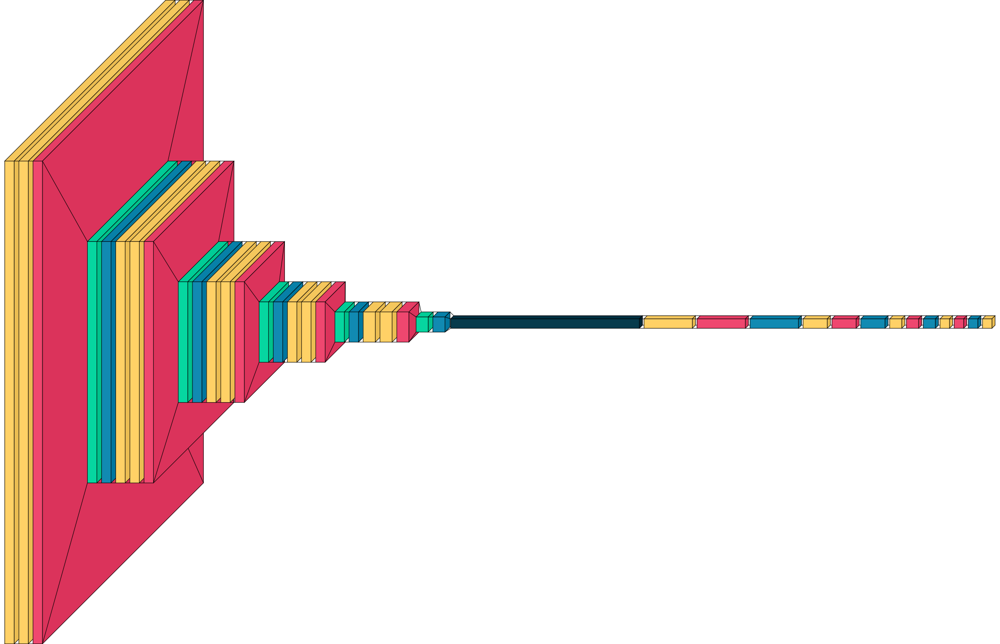

In [113]:
import visualkeras
visualkeras.layered_view(model)